#   UrbanSound Classification 
![](http://www.100urban.nl/media/wysiwyg/slide-5.jpg)


## Description :
>UrbanSound dataset contains 8,732 labelled sound clips (4 seconds each) from ten classes: air conditioner, car horn, children playing, dog bark, drilling, engine idling, gunshot, jackhammer, siren, and street music.

## Class Name
*  Air Conditon
*  Car horn
*  Children playing
*  Dog bark
*  Drilling
*  Engine Idling
*  Gunshot
*  Jackhammer
*  Siren
*  Street Music


In [1]:
%%capture
!apt-get install libav-tools -y

%matplotlib inline
import os
import pandas as pd
import numpy as np
import librosa
import librosa.display
import seaborn as sns
import torchvision.models as models
import matplotlib
import matplotlib.pyplot as plt
import IPython.display as ipd


sns.set(style='whitegrid')
plt.style.use('seaborn-darkgrid')
#seaborn-ticks
from fastai.callbacks import *
from sklearn.metrics import roc_curve, auc
from fastai.vision import *
from glob import glob

In [2]:
df_train = pd.read_csv('../input/train.csv')
df_test = pd.read_csv('../input/test.csv')

print('Train Size: ', df_train.shape)
print('Test Size: ', df_test.shape)

Train Size:  (5435, 2)
Test Size:  (3297, 1)


> ## **Check if we have a balance dataset**
> We can see from the distribution of the classes that we have a balance dataset, with only two classes under-represented: car horn and gunshot

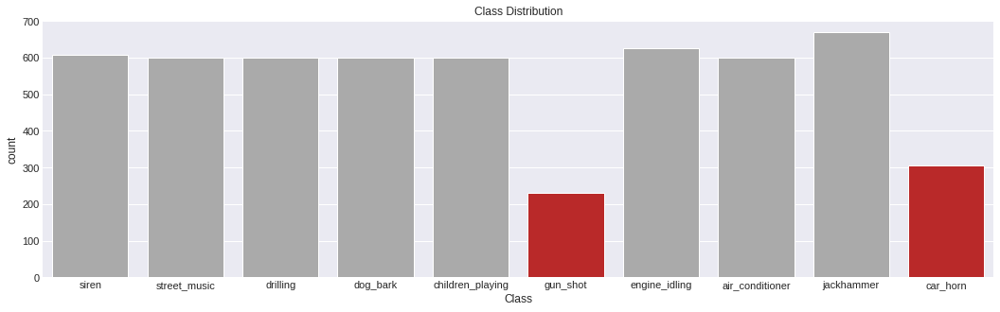

In [3]:
Class = df_train.Class.value_counts()
colours = ["#aaaaaa", "#aaaaaa", "#aaaaaa","#aaaaaa","#aaaaaa","#d11111","#aaaaaa","#aaaaaa","#aaaaaa","#d11111"]
f, ax = plt.subplots(figsize=(18,5)) 
ax = sns.countplot(x='Class', data=df_train, palette=colours)
plt.title('Class Distribution');

# **Loading an audio file**
*  loads and decodes the audio as a time series y, represented as a one-dimensional numpy  array. 
* The variable sr contains the sampling rate of y, that is, the number of samples per second of audio. 
* By default, all audio is mixed to mono and resampled to 22050 Hz at load time. There 22050 values stored for every second of audio

#### This means that 4 secs. audio contains 88,200 samples that's a lot of information, and we need to reduce this to more manageable level.

Class:  air_conditioner
Sampling Rate:  22050 Hz
Duration:  4.0
Number of samples:  88200


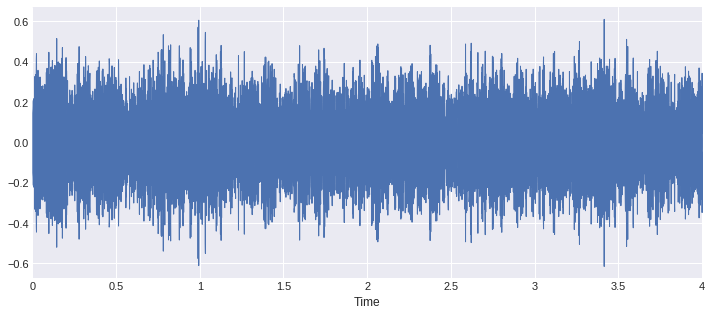

In [4]:
i = random.choice(df_train.index)
y, sr = librosa.load('../input/train/Train/' + str(df_train.ID[i]) + '.wav')
plt.figure(figsize=(12,5))
librosa.display.waveplot(y,sr);
print('Class: ', df_train.Class[i])
print('Sampling Rate: ',sr,'Hz')
print('Duration: ',len(y)/sr)
print('Number of samples: ', len(y))
ipd.Audio(data=y, rate=sr)

# Audio Data Augmentation
> Data augmentation is generally used for machine learning and deep learning in order to achieve a good performance after training generating a large amount of data
* **Background noise** - Mix the sample with another recording
* **Time Stretching** - Slowdown or speedup the audio
* **Pitch Shifting** - Lower the pitch of the audio

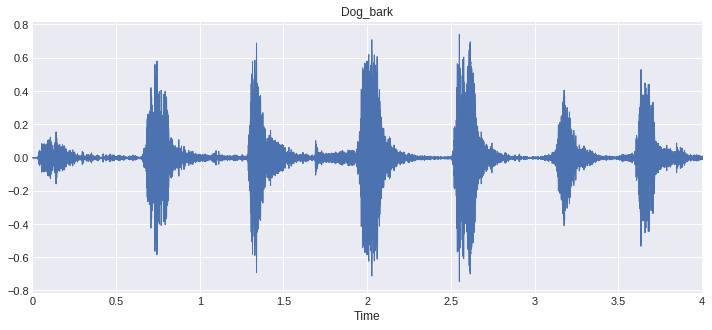

In [5]:
y, sr = librosa.load('../input/train/Train/68.wav')
plt.figure(figsize=(12,5))
librosa.display.waveplot(y,sr);
plt.title('Dog_bark')
ipd.Audio(data=y, rate=sr)

# Background Noise

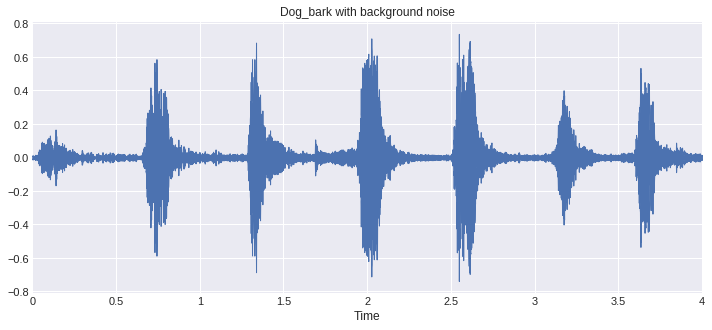

In [6]:
plt.figure(figsize=(12,5))
noise = np.random.randn(len(y))
data_noise = y + 0.005 * noise
librosa.display.waveplot(data_noise,sr);
plt.title('Dog_bark with background noise')
ipd.Audio(data=data_noise, rate=sr)

# Time Stretching


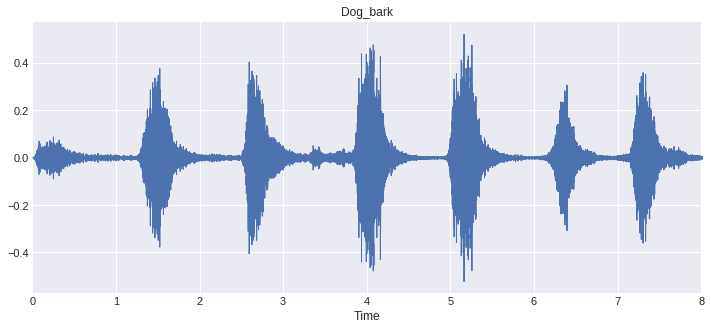

In [7]:
plt.figure(figsize=(12,5))
y_fast = librosa.effects.time_stretch(y, 0.5)
librosa.display.waveplot(y_fast,sr);
plt.title('Dog_bark')
ipd.Audio(data=y_fast, rate=sr)

# Pitch Shifting

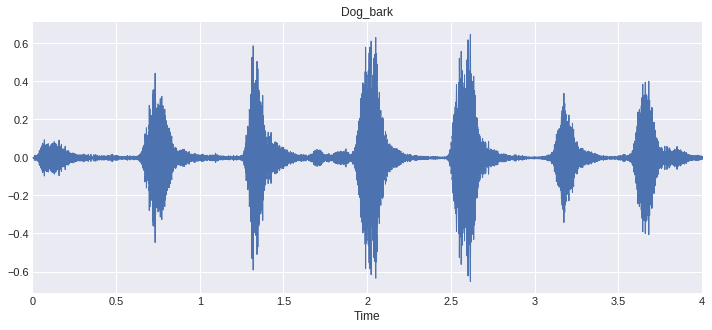

In [8]:
plt.figure(figsize=(12,5))
y_third = librosa.effects.pitch_shift(y, sr, n_steps=20)
librosa.display.waveplot(y_third,sr)
plt.title('Dog_bark')
ipd.Audio(data=y_third, rate=sr)

## There are 2 commony ways to represent sound:

![](https://data.crazyengineers.com/old-attachments/1/1452-time_vs_freq1.gif)
     
> *  **Time domain**:  each sample represents the variation in air pressure.
> *  **Frequency domain:**  at each time stamp we indicate the amplitude for each frequency.

In [9]:
# Loading audio
def load_sound_files(parent_dir, file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(parent_dir + str(fp))
        raw_sounds.append(X)
    return raw_sounds

#plot waveplots
def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,12), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        librosa.display.waveplot(np.array(f), sr)
        plt.title(n.title())
        i += 1
    plt.suptitle('Waveplot',x=0.5, y=0.95,fontsize=18)
    plt.show()

#plot fourier transform
def plot_fft(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,12), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        X = scipy.fft(f)
        X_mag = np.absolute(X)
        f = np.linspace(0, sr, len(X_mag))
        plt.title(n.title())
        plt.plot(f, X_mag)
        plt.xlabel('Frequency')
        i += 1
    plt.suptitle('Fourier Transform',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
    
#plot Mel-scale-power Spectrogram
def plot_mel_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        S = librosa.feature.melspectrogram(y=f, sr=sr,n_fft=2048, hop_length=512)
        librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
        plt.title(n.title())
        i += 1
    plt.suptitle('Mel-scaled power spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
#plot Mfccs
def plot_mfccs(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        S = librosa.feature.mfcc(y=f, sr=sr, dct_type=2)
        librosa.display.specshow(S)
        plt.title(n.title())
        i += 1
    plt.suptitle('Mel frequency cepstral coefficients ',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
#plot Spectrogram Constrast    
def plot_chroma(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        S = np.abs(librosa.stft(f))
        chroma = librosa.feature.chroma_stft(S=S, sr=sr)
        librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
        plt.title(n.title())
        i += 1
    plt.suptitle('Chromagram of a short time fourier transform ',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
#plot ROC_AUC
def cal_auc_and_plot(learn):
    preds, y = learn.get_preds()
    probs = np.exp(preds[:,1])
    fpr, tpr, thresholds = roc_curve(y, probs, pos_label=1)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.01])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    return roc_auc
    
sound_file_paths = ['77.wav','88.wav','6.wav','71.wav','2.wav','17.wav','59.wav','104.wav','3.wav','1.wav']
sound_names = list(np.unique(df_train.Class))
parent_dir = "../input/train/Train/"

raw_sounds = load_sound_files(parent_dir, sound_file_paths)


# Time Domain


In [10]:
plot_waves(sound_names, raw_sounds)

# Fourier Transform
* The Fourier transform is a mathematical technique that allows an MR signal to be decomposed into a sum of sine waves of different frequencies, phases, and amplitudes.
![](http://mriquestions.com/uploads/3/4/5/7/34572113/3311485_orig.gif)

# Frequency Domain
> It transforms our time-domain signal into the frequency domain

> We will use Fourier’s Transform to convert our audio data to the frequency domain. This allows for a much more simple and compact representation of the data.

In [11]:
plot_fft(sound_names,raw_sounds)

# **Feature Extraction**
> Feature extraction is used to convert the acoustic signal into a sequence of acoustic feature vectors that carry a good representation of input speech signal. The idea is to reduce the ten thousands of data points in each file into a much smaller set of features of fixed number.

* **Mel-scaled power spectrogram**- The Mel Scale is used to provide greater resolution for more informative ( lower) frequencies
* **Mel-frequency cepstral coefficients (MFCCs)**- The coefficients that collectively make up the short-term power spectrum of a sound
* **Chroma_stft** - Projects into bins representing the 12  distinct semitones (or chroma) of the musical octave


In [12]:
plot_mel_specgram(sound_names, raw_sounds)

# Mel Frequency Cepstral Coefficients
* The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.


In [13]:
plot_mfccs(sound_names, raw_sounds)

# Chroma short time fourier transform
* Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

In [14]:
plot_chroma(sound_names, raw_sounds)

In [15]:
!mkdir /kaggle/working/melspec_train
!mkdir /kaggle/working/mfccs_train
!mkdir /kaggle/working/chroma_train

# **Converting audio to Image**

In [16]:
# Converting audio to Mel scaled power spectrogram Image
def create_melspec(filename,name):
    plt.interactive(False)
    clip, sample_rate = librosa.load(filename, duration=2.97)
    fig = plt.figure(figsize=[0.72,0.72])
    ax = fig.add_subplot(111)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    S = librosa.feature.melspectrogram(y=clip, sr=sample_rate,n_fft=2048, hop_length=512)
    librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
    filename  = Path('/kaggle/working/melspec_train/' + name + '.jpg')
    plt.savefig(filename, dpi=400, bbox_inches='tight',pad_inches=0)
    plt.close()    
    fig.clf()
    plt.close(fig)
    plt.close('all')
    del filename,name,clip,sample_rate,fig,ax,S

In [17]:
# Converting audio to Mel frequency cepstral coefficients Image
def create_mfccs(filename,name):
    plt.interactive(False)
    clip, sample_rate = librosa.load(filename, duration=2.97)
    fig = plt.figure(figsize=[0.72,0.72])
    ax = fig.add_subplot(111)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    S = librosa.feature.mfcc(y=clip, sr=sample_rate, dct_type=2)
    librosa.display.specshow(S)
    filename  = Path('/kaggle/working/mfccs_train/' + name + '.jpg')
    plt.savefig(filename, dpi=400, bbox_inches='tight',pad_inches=0)
    plt.close()    
    fig.clf()
    plt.close(fig)
    plt.close('all')
    del filename,name,clip,sample_rate,fig,ax,S

In [18]:
# Converting audio to Chroma Image
def create_chroma(filename,name):
    plt.interactive(False)
    clip, sample_rate = librosa.load(filename, duration=2.97)
    fig = plt.figure(figsize=[0.72,0.72])
    ax = fig.add_subplot(111)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_frame_on(False)
    S = np.abs(librosa.stft(clip))
    chroma = librosa.feature.chroma_stft(S=S, sr=sample_rate)
    librosa.display.specshow(chroma)
    filename  = Path('/kaggle/working/chroma_train/' + name + '.jpg')
    plt.savefig(filename, dpi=400, bbox_inches='tight',pad_inches=0)
    plt.close()    
    fig.clf()
    plt.close(fig)
    plt.close('all')
    del filename,name,clip,sample_rate,fig,ax,S

In [19]:
Data_dir=np.array(glob("../input/train/Train/*"))

for file in Data_dir:
    print(file)
    filename,name = file,file.split('/')[-1].split('.')[0]
    create_melspec(filename,name);
    create_mfccs(filename,name);
    create_chroma(filename,name);

../input/train/Train/7115.wav
../input/train/Train/8501.wav
../input/train/Train/7053.wav
../input/train/Train/8447.wav
../input/train/Train/6556.wav
../input/train/Train/4181.wav
../input/train/Train/6933.wav
../input/train/Train/7170.wav
../input/train/Train/8079.wav
../input/train/Train/1187.wav
../input/train/Train/1092.wav
../input/train/Train/2790.wav
../input/train/Train/7910.wav
../input/train/Train/4179.wav
../input/train/Train/5494.wav
../input/train/Train/3840.wav
../input/train/Train/7084.wav
../input/train/Train/8043.wav
../input/train/Train/4688.wav
../input/train/Train/3956.wav
../input/train/Train/2801.wav
../input/train/Train/770.wav
../input/train/Train/1038.wav
../input/train/Train/1056.wav
../input/train/Train/1062.wav
../input/train/Train/134.wav
../input/train/Train/3266.wav
../input/train/Train/5607.wav
../input/train/Train/6721.wav
../input/train/Train/8317.wav
../input/train/Train/1822.wav
../input/train/Train/7776.wav
../input/train/Train/1867.wav
../input/tra

../input/train/Train/3834.wav
../input/train/Train/654.wav
../input/train/Train/3653.wav
../input/train/Train/6507.wav
../input/train/Train/6451.wav
../input/train/Train/2725.wav
../input/train/Train/1303.wav
../input/train/Train/7963.wav
../input/train/Train/4821.wav
../input/train/Train/4337.wav
../input/train/Train/6517.wav
../input/train/Train/3717.wav
../input/train/Train/1209.wav
../input/train/Train/7202.wav
../input/train/Train/2821.wav
../input/train/Train/6305.wav
../input/train/Train/1536.wav
../input/train/Train/2.wav
../input/train/Train/8174.wav
../input/train/Train/1279.wav
../input/train/Train/3357.wav
../input/train/Train/2993.wav
../input/train/Train/350.wav
../input/train/Train/5159.wav
../input/train/Train/456.wav
../input/train/Train/4641.wav
../input/train/Train/2200.wav
../input/train/Train/1004.wav
../input/train/Train/7235.wav
../input/train/Train/2196.wav
../input/train/Train/1301.wav
../input/train/Train/4610.wav
../input/train/Train/2988.wav
../input/train/T

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/4990.wav
../input/train/Train/5772.wav
../input/train/Train/8048.wav
../input/train/Train/2668.wav
../input/train/Train/394.wav
../input/train/Train/5225.wav
../input/train/Train/4616.wav
../input/train/Train/1040.wav
../input/train/Train/3936.wav
../input/train/Train/3649.wav
../input/train/Train/4991.wav
../input/train/Train/1988.wav
../input/train/Train/8540.wav
../input/train/Train/6055.wav
../input/train/Train/130.wav
../input/train/Train/6019.wav
../input/train/Train/4704.wav
../input/train/Train/6339.wav
../input/train/Train/8381.wav
../input/train/Train/401.wav
../input/train/Train/3316.wav
../input/train/Train/7970.wav
../input/train/Train/2828.wav
../input/train/Train/5824.wav
../input/train/Train/4158.wav
../input/train/Train/5128.wav
../input/train/Train/235.wav
../input/train/Train/6469.wav
../input/train/Train/1826.wav
../input/train/Train/6427.wav
../input/train/Train/8071.wav
../input/train/Train/3696.wav
../input/train/Train/5758.wav
../input/train

../input/train/Train/3126.wav
../input/train/Train/474.wav
../input/train/Train/579.wav
../input/train/Train/2863.wav
../input/train/Train/8682.wav
../input/train/Train/5407.wav
../input/train/Train/3115.wav
../input/train/Train/8184.wav
../input/train/Train/7002.wav
../input/train/Train/3756.wav
../input/train/Train/3030.wav
../input/train/Train/8067.wav
../input/train/Train/5409.wav
../input/train/Train/3305.wav
../input/train/Train/3180.wav
../input/train/Train/4279.wav
../input/train/Train/412.wav
../input/train/Train/7156.wav
../input/train/Train/6895.wav
../input/train/Train/4992.wav
../input/train/Train/604.wav
../input/train/Train/3610.wav
../input/train/Train/8491.wav
../input/train/Train/3702.wav
../input/train/Train/5672.wav
../input/train/Train/3534.wav
../input/train/Train/372.wav
../input/train/Train/2220.wav
../input/train/Train/8492.wav
../input/train/Train/4899.wav
../input/train/Train/1546.wav
../input/train/Train/4444.wav
../input/train/Train/218.wav
../input/train/T

../input/train/Train/2685.wav
../input/train/Train/5010.wav
../input/train/Train/3471.wav
../input/train/Train/4745.wav
../input/train/Train/5984.wav
../input/train/Train/7686.wav
../input/train/Train/3445.wav
../input/train/Train/7490.wav
../input/train/Train/8161.wav
../input/train/Train/1899.wav
../input/train/Train/6778.wav
../input/train/Train/2932.wav
../input/train/Train/4889.wav
../input/train/Train/5259.wav
../input/train/Train/3087.wav
../input/train/Train/687.wav
../input/train/Train/2301.wav
../input/train/Train/5025.wav
../input/train/Train/1500.wav
../input/train/Train/5716.wav
../input/train/Train/3150.wav
../input/train/Train/1276.wav
../input/train/Train/3003.wav
../input/train/Train/3850.wav
../input/train/Train/2623.wav
../input/train/Train/229.wav
../input/train/Train/1131.wav
../input/train/Train/2013.wav
../input/train/Train/6500.wav
../input/train/Train/1908.wav
../input/train/Train/717.wav
../input/train/Train/1319.wav
../input/train/Train/719.wav
../input/train

../input/train/Train/2526.wav
../input/train/Train/8660.wav
../input/train/Train/8024.wav
../input/train/Train/5329.wav
../input/train/Train/7263.wav
../input/train/Train/2138.wav


/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/7581.wav
../input/train/Train/7935.wav
../input/train/Train/1843.wav
../input/train/Train/6152.wav
../input/train/Train/2141.wav
../input/train/Train/8370.wav
../input/train/Train/269.wav
../input/train/Train/525.wav
../input/train/Train/5546.wav
../input/train/Train/6530.wav
../input/train/Train/1870.wav
../input/train/Train/4650.wav
../input/train/Train/1273.wav
../input/train/Train/7354.wav
../input/train/Train/839.wav
../input/train/Train/1355.wav
../input/train/Train/734.wav
../input/train/Train/6956.wav
../input/train/Train/2538.wav
../input/train/Train/1935.wav
../input/train/Train/5980.wav
../input/train/Train/8510.wav
../input/train/Train/2789.wav
../input/train/Train/5263.wav
../input/train/Train/3900.wav
../input/train/Train/1690.wav
../input/train/Train/3371.wav
../input/train/Train/3902.wav
../input/train/Train/7639.wav
../input/train/Train/3763.wav
../input/train/Train/2697.wav
../input/train/Train/679.wav
../input/train/Train/2517.wav
../input/train/

../input/train/Train/5808.wav
../input/train/Train/4102.wav
../input/train/Train/1891.wav
../input/train/Train/8236.wav
../input/train/Train/3509.wav
../input/train/Train/6366.wav
../input/train/Train/2909.wav
../input/train/Train/664.wav
../input/train/Train/2028.wav
../input/train/Train/4820.wav
../input/train/Train/346.wav
../input/train/Train/1001.wav
../input/train/Train/6857.wav
../input/train/Train/7673.wav
../input/train/Train/3294.wav
../input/train/Train/1195.wav
../input/train/Train/3585.wav
../input/train/Train/8694.wav
../input/train/Train/4528.wav
../input/train/Train/1352.wav
../input/train/Train/1542.wav
../input/train/Train/4226.wav
../input/train/Train/6372.wav
../input/train/Train/4733.wav
../input/train/Train/6811.wav
../input/train/Train/8073.wav
../input/train/Train/3190.wav
../input/train/Train/1978.wav
../input/train/Train/6621.wav
../input/train/Train/7338.wav
../input/train/Train/1191.wav
../input/train/Train/8151.wav
../input/train/Train/1890.wav
../input/tra

../input/train/Train/6653.wav
../input/train/Train/1791.wav
../input/train/Train/1462.wav
../input/train/Train/3206.wav
../input/train/Train/5466.wav
../input/train/Train/2402.wav
../input/train/Train/5461.wav
../input/train/Train/4667.wav
../input/train/Train/3186.wav
../input/train/Train/7597.wav
../input/train/Train/5228.wav
../input/train/Train/272.wav
../input/train/Train/5907.wav
../input/train/Train/7875.wav
../input/train/Train/8075.wav
../input/train/Train/5426.wav
../input/train/Train/1970.wav
../input/train/Train/276.wav
../input/train/Train/566.wav
../input/train/Train/275.wav
../input/train/Train/3823.wav
../input/train/Train/2388.wav
../input/train/Train/1034.wav
../input/train/Train/2825.wav
../input/train/Train/222.wav
../input/train/Train/979.wav
../input/train/Train/8605.wav
../input/train/Train/589.wav
../input/train/Train/2940.wav
../input/train/Train/4784.wav
../input/train/Train/8644.wav
../input/train/Train/3453.wav
../input/train/Train/8500.wav
../input/train/Tr

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/5382.wav
../input/train/Train/175.wav
../input/train/Train/8435.wav
../input/train/Train/758.wav
../input/train/Train/7867.wav
../input/train/Train/288.wav
../input/train/Train/605.wav
../input/train/Train/8581.wav
../input/train/Train/2433.wav
../input/train/Train/6290.wav
../input/train/Train/4911.wav
../input/train/Train/5513.wav
../input/train/Train/3026.wav
../input/train/Train/6667.wav
../input/train/Train/5278.wav
../input/train/Train/7197.wav
../input/train/Train/1699.wav
../input/train/Train/6694.wav
../input/train/Train/6358.wav
../input/train/Train/2869.wav
../input/train/Train/5119.wav
../input/train/Train/3893.wav
../input/train/Train/4313.wav
../input/train/Train/8127.wav
../input/train/Train/1015.wav
../input/train/Train/6229.wav
../input/train/Train/8315.wav
../input/train/Train/751.wav
../input/train/Train/3729.wav
../input/train/Train/4896.wav
../input/train/Train/6426.wav
../input/train/Train/6753.wav
../input/train/Train/3501.wav
../input/train/

../input/train/Train/1808.wav
../input/train/Train/3771.wav
../input/train/Train/8474.wav
../input/train/Train/3244.wav
../input/train/Train/2931.wav
../input/train/Train/7488.wav
../input/train/Train/7977.wav
../input/train/Train/2419.wav
../input/train/Train/8542.wav
../input/train/Train/2090.wav
../input/train/Train/2057.wav
../input/train/Train/2676.wav
../input/train/Train/586.wav
../input/train/Train/2545.wav
../input/train/Train/6293.wav
../input/train/Train/7177.wav
../input/train/Train/4799.wav
../input/train/Train/5331.wav
../input/train/Train/7754.wav
../input/train/Train/4111.wav
../input/train/Train/8673.wav
../input/train/Train/4602.wav
../input/train/Train/4422.wav
../input/train/Train/5202.wav
../input/train/Train/7671.wav
../input/train/Train/7204.wav
../input/train/Train/35.wav
../input/train/Train/8064.wav
../input/train/Train/2102.wav
../input/train/Train/4612.wav
../input/train/Train/3680.wav
../input/train/Train/7944.wav
../input/train/Train/2404.wav
../input/trai

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/4453.wav
../input/train/Train/3197.wav
../input/train/Train/3881.wav
../input/train/Train/838.wav
../input/train/Train/8152.wav
../input/train/Train/211.wav
../input/train/Train/5642.wav
../input/train/Train/4767.wav
../input/train/Train/4017.wav
../input/train/Train/2986.wav
../input/train/Train/4389.wav
../input/train/Train/5057.wav
../input/train/Train/4989.wav
../input/train/Train/3725.wav
../input/train/Train/1137.wav
../input/train/Train/5598.wav
../input/train/Train/4498.wav
../input/train/Train/5117.wav
../input/train/Train/8081.wav
../input/train/Train/2907.wav
../input/train/Train/8380.wav
../input/train/Train/5154.wav
../input/train/Train/311.wav
../input/train/Train/3423.wav
../input/train/Train/6901.wav
../input/train/Train/2218.wav
../input/train/Train/5909.wav
../input/train/Train/2430.wav
../input/train/Train/8238.wav
../input/train/Train/2265.wav
../input/train/Train/8128.wav
../input/train/Train/7521.wav
../input/train/Train/5094.wav
../input/trai

../input/train/Train/8466.wav
../input/train/Train/1028.wav
../input/train/Train/8482.wav
../input/train/Train/1994.wav
../input/train/Train/7175.wav
../input/train/Train/2593.wav
../input/train/Train/1601.wav
../input/train/Train/7890.wav
../input/train/Train/5271.wav
../input/train/Train/6284.wav
../input/train/Train/2204.wav
../input/train/Train/2738.wav
../input/train/Train/81.wav
../input/train/Train/6297.wav
../input/train/Train/6580.wav
../input/train/Train/6928.wav
../input/train/Train/3276.wav
../input/train/Train/4474.wav
../input/train/Train/670.wav
../input/train/Train/3560.wav
../input/train/Train/3250.wav
../input/train/Train/309.wav
../input/train/Train/6418.wav
../input/train/Train/103.wav
../input/train/Train/4805.wav
../input/train/Train/7561.wav
../input/train/Train/698.wav
../input/train/Train/263.wav
../input/train/Train/3439.wav
../input/train/Train/8244.wav
../input/train/Train/3914.wav
../input/train/Train/2077.wav
../input/train/Train/4970.wav
../input/train/Tr

../input/train/Train/3016.wav
../input/train/Train/2463.wav
../input/train/Train/1428.wav
../input/train/Train/6296.wav
../input/train/Train/2614.wav
../input/train/Train/7162.wav
../input/train/Train/6156.wav
../input/train/Train/1311.wav
../input/train/Train/6929.wav
../input/train/Train/8715.wav
../input/train/Train/5827.wav
../input/train/Train/7734.wav
../input/train/Train/4566.wav
../input/train/Train/1874.wav
../input/train/Train/5201.wav
../input/train/Train/1496.wav
../input/train/Train/8191.wav
../input/train/Train/8074.wav
../input/train/Train/4918.wav
../input/train/Train/3764.wav
../input/train/Train/4346.wav
../input/train/Train/6535.wav
../input/train/Train/1593.wav
../input/train/Train/6012.wav
../input/train/Train/5028.wav
../input/train/Train/2082.wav
../input/train/Train/185.wav
../input/train/Train/8610.wav
../input/train/Train/4927.wav
../input/train/Train/7623.wav
../input/train/Train/7061.wav
../input/train/Train/43.wav
../input/train/Train/3207.wav
../input/trai

../input/train/Train/6543.wav
../input/train/Train/2458.wav
../input/train/Train/4249.wav
../input/train/Train/3896.wav
../input/train/Train/3170.wav
../input/train/Train/3095.wav
../input/train/Train/2954.wav
../input/train/Train/425.wav
../input/train/Train/6374.wav
../input/train/Train/8604.wav
../input/train/Train/5702.wav
../input/train/Train/4100.wav
../input/train/Train/7067.wav
../input/train/Train/5597.wav
../input/train/Train/1629.wav
../input/train/Train/5174.wav
../input/train/Train/871.wav
../input/train/Train/6158.wav
../input/train/Train/2763.wav
../input/train/Train/3395.wav
../input/train/Train/6945.wav
../input/train/Train/7529.wav
../input/train/Train/3416.wav
../input/train/Train/853.wav
../input/train/Train/1328.wav
../input/train/Train/8701.wav
../input/train/Train/2896.wav
../input/train/Train/3055.wav
../input/train/Train/4436.wav
../input/train/Train/6129.wav
../input/train/Train/357.wav
../input/train/Train/8181.wav
../input/train/Train/7712.wav
../input/train

../input/train/Train/236.wav
../input/train/Train/676.wav
../input/train/Train/1390.wav
../input/train/Train/2935.wav
../input/train/Train/2318.wav
../input/train/Train/2116.wav
../input/train/Train/5472.wav
../input/train/Train/7087.wav
../input/train/Train/5052.wav
../input/train/Train/5319.wav
../input/train/Train/5488.wav
../input/train/Train/7785.wav
../input/train/Train/2889.wav
../input/train/Train/2571.wav
../input/train/Train/928.wav
../input/train/Train/6321.wav
../input/train/Train/5390.wav
../input/train/Train/6283.wav
../input/train/Train/457.wav
../input/train/Train/4611.wav
../input/train/Train/2644.wav
../input/train/Train/3358.wav
../input/train/Train/7828.wav
../input/train/Train/2099.wav


/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/2584.wav
../input/train/Train/5900.wav
../input/train/Train/8595.wav
../input/train/Train/4754.wav
../input/train/Train/6061.wav
../input/train/Train/1709.wav
../input/train/Train/622.wav
../input/train/Train/5199.wav
../input/train/Train/2548.wav
../input/train/Train/5547.wav
../input/train/Train/1475.wav
../input/train/Train/4491.wav
../input/train/Train/2479.wav
../input/train/Train/3459.wav
../input/train/Train/8324.wav
../input/train/Train/995.wav
../input/train/Train/7547.wav
../input/train/Train/3759.wav
../input/train/Train/6740.wav
../input/train/Train/8384.wav
../input/train/Train/5780.wav
../input/train/Train/3519.wav
../input/train/Train/7218.wav
../input/train/Train/6810.wav
../input/train/Train/2878.wav
../input/train/Train/1175.wav
../input/train/Train/3275.wav
../input/train/Train/8085.wav
../input/train/Train/965.wav
../input/train/Train/138.wav
../input/train/Train/6846.wav
../input/train/Train/8603.wav
../input/train/Train/1895.wav
../input/train

../input/train/Train/8590.wav
../input/train/Train/3959.wav
../input/train/Train/4785.wav
../input/train/Train/2466.wav
../input/train/Train/8090.wav
../input/train/Train/6642.wav
../input/train/Train/6081.wav
../input/train/Train/3103.wav
../input/train/Train/8594.wav
../input/train/Train/3838.wav
../input/train/Train/6649.wav
../input/train/Train/67.wav
../input/train/Train/1883.wav
../input/train/Train/2962.wav
../input/train/Train/635.wav
../input/train/Train/4191.wav
../input/train/Train/1527.wav
../input/train/Train/5950.wav
../input/train/Train/4096.wav
../input/train/Train/5175.wav
../input/train/Train/248.wav
../input/train/Train/8032.wav
../input/train/Train/352.wav
../input/train/Train/3880.wav
../input/train/Train/5625.wav
../input/train/Train/4964.wav
../input/train/Train/562.wav
../input/train/Train/7149.wav
../input/train/Train/4411.wav
../input/train/Train/7013.wav
../input/train/Train/5251.wav
../input/train/Train/4573.wav
../input/train/Train/3443.wav
../input/train/T

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/3554.wav
../input/train/Train/22.wav
../input/train/Train/4255.wav
../input/train/Train/6668.wav
../input/train/Train/5582.wav
../input/train/Train/8111.wav
../input/train/Train/4104.wav
../input/train/Train/3230.wav
../input/train/Train/282.wav
../input/train/Train/8263.wav
../input/train/Train/683.wav
../input/train/Train/3894.wav
../input/train/Train/2650.wav
../input/train/Train/2456.wav
../input/train/Train/6241.wav
../input/train/Train/1115.wav
../input/train/Train/336.wav
../input/train/Train/3787.wav
../input/train/Train/611.wav
../input/train/Train/5691.wav
../input/train/Train/7377.wav
../input/train/Train/3833.wav
../input/train/Train/7294.wav
../input/train/Train/1606.wav
../input/train/Train/8352.wav
../input/train/Train/2180.wav
../input/train/Train/8046.wav
../input/train/Train/71.wav
../input/train/Train/6837.wav
../input/train/Train/4824.wav
../input/train/Train/331.wav
../input/train/Train/3726.wav
../input/train/Train/6739.wav
../input/train/Trai

../input/train/Train/6616.wav
../input/train/Train/2637.wav
../input/train/Train/8270.wav
../input/train/Train/5376.wav
../input/train/Train/4665.wav
../input/train/Train/5353.wav
../input/train/Train/4960.wav
../input/train/Train/8659.wav
../input/train/Train/5456.wav
../input/train/Train/6914.wav
../input/train/Train/744.wav
../input/train/Train/2016.wav
../input/train/Train/7144.wav
../input/train/Train/2324.wav
../input/train/Train/2022.wav
../input/train/Train/7979.wav
../input/train/Train/7403.wav
../input/train/Train/3495.wav
../input/train/Train/685.wav
../input/train/Train/3436.wav
../input/train/Train/8599.wav
../input/train/Train/5712.wav
../input/train/Train/4142.wav
../input/train/Train/5871.wav
../input/train/Train/8613.wav
../input/train/Train/858.wav
../input/train/Train/6234.wav
../input/train/Train/6466.wav
../input/train/Train/2507.wav
../input/train/Train/730.wav
../input/train/Train/5695.wav
../input/train/Train/8711.wav
../input/train/Train/388.wav
../input/train/

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/6749.wav
../input/train/Train/8635.wav
../input/train/Train/7383.wav
../input/train/Train/6053.wav
../input/train/Train/4068.wav
../input/train/Train/3071.wav
../input/train/Train/5171.wav
../input/train/Train/8189.wav
../input/train/Train/3461.wav
../input/train/Train/2832.wav
../input/train/Train/6191.wav
../input/train/Train/5615.wav
../input/train/Train/4204.wav
../input/train/Train/4847.wav
../input/train/Train/7450.wav
../input/train/Train/6434.wav
../input/train/Train/5135.wav
../input/train/Train/6737.wav
../input/train/Train/3229.wav
../input/train/Train/5813.wav
../input/train/Train/2800.wav
../input/train/Train/5427.wav
../input/train/Train/3658.wav
../input/train/Train/6274.wav
../input/train/Train/3001.wav
../input/train/Train/7249.wav
../input/train/Train/826.wav
../input/train/Train/7094.wav
../input/train/Train/5253.wav
../input/train/Train/3883.wav
../input/train/Train/8552.wav
../input/train/Train/5874.wav
../input/train/Train/5966.wav
../input/tr

/opt/conda/lib/python3.6/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


../input/train/Train/3630.wav
../input/train/Train/2815.wav
../input/train/Train/7302.wav
../input/train/Train/2581.wav
../input/train/Train/2441.wav
../input/train/Train/4095.wav
../input/train/Train/3827.wav
../input/train/Train/2412.wav
../input/train/Train/3474.wav
../input/train/Train/1774.wav
../input/train/Train/3836.wav
../input/train/Train/1547.wav
../input/train/Train/913.wav
../input/train/Train/5865.wav
../input/train/Train/3846.wav
../input/train/Train/3569.wav
../input/train/Train/7126.wav
../input/train/Train/8084.wav
../input/train/Train/6931.wav
../input/train/Train/1761.wav
../input/train/Train/3700.wav
../input/train/Train/2470.wav
../input/train/Train/6351.wav
../input/train/Train/746.wav
../input/train/Train/6502.wav
../input/train/Train/2918.wav
../input/train/Train/4139.wav
../input/train/Train/3614.wav
../input/train/Train/692.wav
../input/train/Train/4837.wav
../input/train/Train/426.wav
../input/train/Train/7258.wav
../input/train/Train/1298.wav
../input/train

../input/train/Train/7599.wav
../input/train/Train/3822.wav
../input/train/Train/2212.wav
../input/train/Train/4203.wav
../input/train/Train/7161.wav
../input/train/Train/4652.wav
../input/train/Train/4420.wav
../input/train/Train/1957.wav
../input/train/Train/3089.wav
../input/train/Train/7622.wav
../input/train/Train/6387.wav
../input/train/Train/65.wav
../input/train/Train/2807.wav
../input/train/Train/4618.wav
../input/train/Train/5960.wav
../input/train/Train/8695.wav
../input/train/Train/5180.wav
../input/train/Train/5344.wav
../input/train/Train/4880.wav
../input/train/Train/6319.wav
../input/train/Train/3656.wav
../input/train/Train/8261.wav
../input/train/Train/6204.wav
../input/train/Train/1663.wav
../input/train/Train/8621.wav
../input/train/Train/4843.wav
../input/train/Train/471.wav
../input/train/Train/5373.wav
../input/train/Train/2455.wav
../input/train/Train/6970.wav
../input/train/Train/3172.wav
../input/train/Train/8446.wav
../input/train/Train/8393.wav
../input/trai

../input/train/Train/2710.wav
../input/train/Train/916.wav
../input/train/Train/196.wav
../input/train/Train/2369.wav
../input/train/Train/6508.wav
../input/train/Train/603.wav
../input/train/Train/3522.wav
../input/train/Train/3943.wav
../input/train/Train/6841.wav
../input/train/Train/7262.wav
../input/train/Train/7245.wav
../input/train/Train/2726.wav
../input/train/Train/1780.wav
../input/train/Train/1987.wav
../input/train/Train/4278.wav
../input/train/Train/5557.wav
../input/train/Train/4826.wav
../input/train/Train/7091.wav
../input/train/Train/1893.wav
../input/train/Train/4433.wav
../input/train/Train/6448.wav
../input/train/Train/3112.wav
../input/train/Train/5265.wav
../input/train/Train/1072.wav
../input/train/Train/2201.wav
../input/train/Train/3731.wav
../input/train/Train/6394.wav
../input/train/Train/5559.wav
../input/train/Train/3037.wav
../input/train/Train/6652.wav
../input/train/Train/3387.wav
../input/train/Train/1872.wav
../input/train/Train/7865.wav
../input/trai

../input/train/Train/2542.wav
../input/train/Train/0.wav
../input/train/Train/4864.wav
../input/train/Train/5770.wav
../input/train/Train/6497.wav
../input/train/Train/3301.wav
../input/train/Train/46.wav
../input/train/Train/5044.wav
../input/train/Train/5046.wav
../input/train/Train/6371.wav
../input/train/Train/5751.wav
../input/train/Train/4775.wav
../input/train/Train/4685.wav
../input/train/Train/7787.wav
../input/train/Train/6461.wav
../input/train/Train/5989.wav
../input/train/Train/2956.wav
../input/train/Train/8657.wav
../input/train/Train/1236.wav
../input/train/Train/3785.wav
../input/train/Train/5742.wav
../input/train/Train/6395.wav
../input/train/Train/4029.wav
../input/train/Train/7783.wav
../input/train/Train/4851.wav
../input/train/Train/436.wav
../input/train/Train/2038.wav
../input/train/Train/4640.wav
../input/train/Train/8588.wav
../input/train/Train/1515.wav
../input/train/Train/5188.wav
../input/train/Train/8457.wav
../input/train/Train/6442.wav
../input/train/T

../input/train/Train/497.wav
../input/train/Train/884.wav
../input/train/Train/3152.wav
../input/train/Train/6091.wav
../input/train/Train/3676.wav
../input/train/Train/121.wav
../input/train/Train/4531.wav
../input/train/Train/2063.wav
../input/train/Train/2580.wav
../input/train/Train/3268.wav
../input/train/Train/1729.wav
../input/train/Train/7430.wav
../input/train/Train/4183.wav
../input/train/Train/3970.wav
../input/train/Train/6162.wav
../input/train/Train/8137.wav
../input/train/Train/2769.wav
../input/train/Train/226.wav
../input/train/Train/1999.wav
../input/train/Train/8167.wav
../input/train/Train/2870.wav
../input/train/Train/4746.wav
../input/train/Train/2674.wav
../input/train/Train/462.wav
../input/train/Train/7133.wav
../input/train/Train/1074.wav
../input/train/Train/886.wav
../input/train/Train/8335.wav
../input/train/Train/820.wav
../input/train/Train/3323.wav
../input/train/Train/7611.wav
../input/train/Train/2010.wav
../input/train/Train/4094.wav
../input/train/Tr

![](//i.imgur.com/xNzkRPF.jpg)

# Creating a ImageDataBunch for training a classifier
*  I**mageDataBunch**  is used to do classification based on images
* **valid_pct** indicate the percentage of the total images to use as the validation set
* **Bs** how many samples per batch to load
* **numworkers** how many subprocesses to use for data loading. 0 means that the data will be loaded in the main process
*  **size**  which the image is to be resized

In [20]:
path = Path('/kaggle/working/')
np.random.seed(42)

melspec_data = ImageDataBunch.from_csv(path,csv_labels='../input/train.csv', folder="melspec_train", valid_pct=0.2, suffix='.jpg', size=224, num_workers=0, bs=128).normalize(imagenet_stats)
mfccs_data = ImageDataBunch.from_csv(path,csv_labels='../input/train.csv', folder="mfccs_train", valid_pct=0.2, suffix='.jpg', size=224, num_workers=0, bs=128).normalize(imagenet_stats)
chroma_data = ImageDataBunch.from_csv(path,csv_labels='../input/train.csv', folder="chroma_train", valid_pct=0.2, suffix='.jpg', size=224, num_workers=0, bs=128).normalize(imagenet_stats)

In [21]:
melspec_data

ImageDataBunch;

Train: LabelList (4348 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
siren,street_music,drilling,siren,dog_bark
Path: /kaggle/working;

Valid: LabelList (1087 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
dog_bark,jackhammer,engine_idling,siren,drilling
Path: /kaggle/working;

Test: None

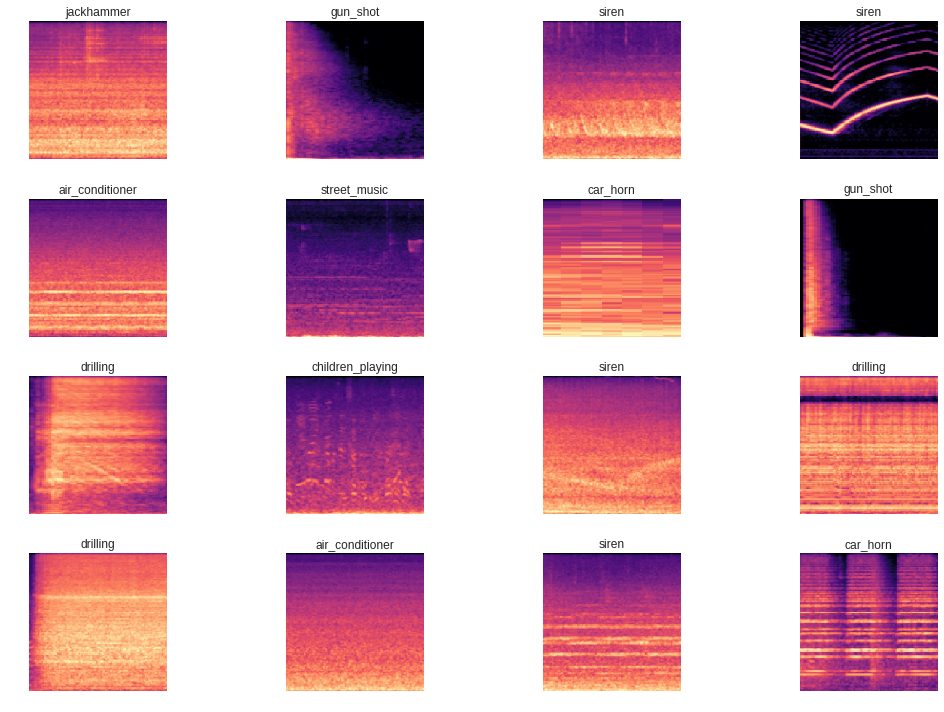

In [22]:
melspec_data.show_batch(4, figsize=(15,10))
plt.show()

# Transfer learning using Resnet34
>  We use  convolutional Neural Network, to classify the melspectrogram, Mffcs, Chroma. This is because CNN's work better in detecting local feature patterns in different parts of the image and are also good at capturing hierarchical features which become subsequenntly complex with every layer as illustrated in the image

In [23]:
learn = create_cnn(melspec_data, models.resnet34, metrics=[accuracy], ps=0.5);
learn.summary()

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")
Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /tmp/.torch/models/resnet34-333f7ec4.pth
87306240it [00:01, 73043064.13it/s]


Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 112, 112]       9,408      False     
______________________________________________________________________
BatchNorm2d          [64, 112, 112]       128        True      
______________________________________________________________________
ReLU                 [64, 112, 112]       0          False     
______________________________________________________________________
MaxPool2d            [64, 56, 56]         0          False     
______________________________________________________________________
Conv2d               [64, 56, 56]         36,864     False     
______________________________________________________________________
BatchNorm2d          [64, 56, 56]         128        True      
______________________________________________________________________
ReLU                 [64, 56, 56]         0          False     
______________________________________________________________

# Training the model
>  **One Cycle Policy** - It is the combination of gradually increasing learning rate, and optionally, gradually decreasing the momentum during the first half of the cycle, then gradually decreasing the learning rate and optionally increasing the momentum during the latter half of the cycle.

epoch,train_loss,valid_loss,accuracy,time
0,1.732155,0.863155,0.710212,00:34
1,1.035627,0.524351,0.826127,00:32
2,0.640068,0.625573,0.788408,00:32
3,0.473397,1.075060,0.722171,00:33
4,0.390831,0.553622,0.840846,00:33
5,0.298760,0.405004,0.894204,00:33
6,0.253096,0.448074,0.850046,00:32
7,0.186485,0.310848,0.907084,00:33
8,0.140212,0.211614,0.938362,00:33
9,0.098346,0.211768,0.936523,00:32


Better model found at epoch 0 with accuracy value: 0.7102115750312805.
Better model found at epoch 1 with accuracy value: 0.8261269330978394.
Better model found at epoch 4 with accuracy value: 0.8408463597297668.
Better model found at epoch 5 with accuracy value: 0.8942042589187622.
Better model found at epoch 7 with accuracy value: 0.9070836901664734.
Better model found at epoch 8 with accuracy value: 0.9383624792098999.
Better model found at epoch 10 with accuracy value: 0.9457221627235413.
Better model found at epoch 11 with accuracy value: 0.9613615274429321.


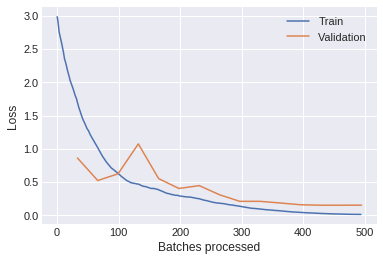

In [24]:
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning
* **lr_find()** - The idea is to reduce the amount of guesswork on picking a good starting learning rate.

*  **Unfreezing pre-trained layers**: Now since we have trained enough our final layers, we will unfreeze the pre-trained ResNet layers and fine tune them

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
6.309573444801933e-07


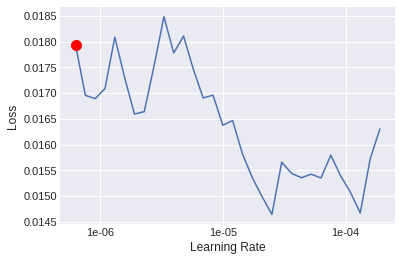

In [25]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr 
print(Learning_rate)
plt.show()

In [26]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('melspec_resnet34_1')

epoch,train_loss,valid_loss,accuracy,time
0,0.020156,0.165141,0.957682,00:35
1,0.017596,0.161561,0.957682,00:36
2,0.016930,0.160968,0.958602,00:35
3,0.014925,0.157047,0.957682,00:36
4,0.016010,0.155844,0.959522,00:35
5,0.013559,0.153508,0.958602,00:36
6,0.012352,0.155254,0.957682,00:36
7,0.011002,0.151624,0.959522,00:36
8,0.010444,0.150605,0.960442,00:35
9,0.011045,0.151605,0.959522,00:36


Better model found at epoch 0 with accuracy value: 0.9576817154884338.
Better model found at epoch 2 with accuracy value: 0.9586016535758972.
Better model found at epoch 4 with accuracy value: 0.9595215916633606.
Better model found at epoch 8 with accuracy value: 0.9604415893554688.


0.9997994866859159

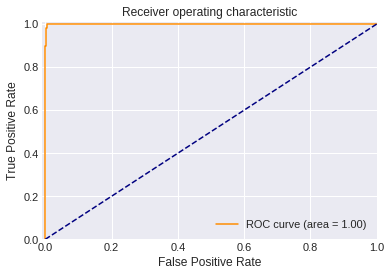

In [27]:
cal_auc_and_plot(learn)

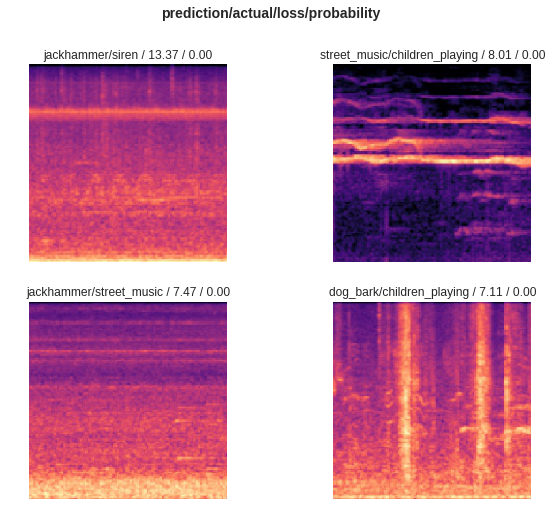

In [28]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

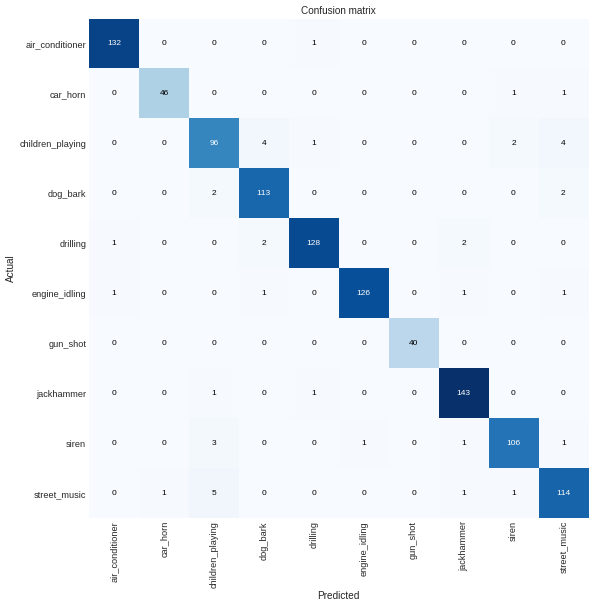

[('street_music', 'children_playing', 5),
 ('children_playing', 'dog_bark', 4),
 ('children_playing', 'street_music', 4),
 ('siren', 'children_playing', 3),
 ('children_playing', 'siren', 2),
 ('dog_bark', 'children_playing', 2),
 ('dog_bark', 'street_music', 2),
 ('drilling', 'dog_bark', 2),
 ('drilling', 'jackhammer', 2),
 ('air_conditioner', 'drilling', 1),
 ('car_horn', 'siren', 1),
 ('car_horn', 'street_music', 1),
 ('children_playing', 'drilling', 1),
 ('drilling', 'air_conditioner', 1),
 ('engine_idling', 'air_conditioner', 1),
 ('engine_idling', 'dog_bark', 1),
 ('engine_idling', 'jackhammer', 1),
 ('engine_idling', 'street_music', 1),
 ('jackhammer', 'children_playing', 1),
 ('jackhammer', 'drilling', 1),
 ('siren', 'engine_idling', 1),
 ('siren', 'jackhammer', 1),
 ('siren', 'street_music', 1),
 ('street_music', 'car_horn', 1),
 ('street_music', 'jackhammer', 1),
 ('street_music', 'siren', 1)]

In [29]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()
interp.most_confused()

# Transfer Learning using Alexnet

In [30]:
alexnet = models.alexnet()
learn = create_cnn(melspec_data, models.alexnet, metrics=[accuracy], ps=0.5);
learn.summary()

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")
Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /tmp/.torch/models/alexnet-owt-4df8aa71.pth
244418560it [00:03, 68991281.98it/s]


Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 55, 55]         23,296     False     
______________________________________________________________________
ReLU                 [64, 55, 55]         0          False     
______________________________________________________________________
MaxPool2d            [64, 27, 27]         0          False     
______________________________________________________________________
Conv2d               [192, 27, 27]        307,392    False     
______________________________________________________________________
ReLU                 [192, 27, 27]        0          False     
______________________________________________________________________
MaxPool2d            [192, 13, 13]        0          False     
______________________________________________________________________
Conv2d               [384, 13, 13]        663,936    False     
______________________________________________________________

# Training the model

epoch,train_loss,valid_loss,accuracy,time
0,1.758933,1.022031,0.666053,00:25
1,1.188582,0.609502,0.809568,00:26
2,0.875805,0.503901,0.839006,00:24
3,0.725334,0.496865,0.832567,00:25
4,0.625318,0.449534,0.853726,00:26
5,0.553771,0.402115,0.874885,00:25
6,0.482472,0.389322,0.877645,00:24
7,0.408911,0.342549,0.894204,00:26
8,0.355599,0.352437,0.895124,00:25
9,0.306643,0.303870,0.902484,00:24


Better model found at epoch 0 with accuracy value: 0.6660533547401428.
Better model found at epoch 1 with accuracy value: 0.8095676302909851.
Better model found at epoch 2 with accuracy value: 0.8390064239501953.
Better model found at epoch 4 with accuracy value: 0.8537258505821228.
Better model found at epoch 5 with accuracy value: 0.8748850226402283.
Better model found at epoch 6 with accuracy value: 0.8776448965072632.
Better model found at epoch 7 with accuracy value: 0.8942042589187622.
Better model found at epoch 8 with accuracy value: 0.8951241970062256.
Better model found at epoch 9 with accuracy value: 0.9024838805198669.
Better model found at epoch 10 with accuracy value: 0.9080036878585815.
Better model found at epoch 11 with accuracy value: 0.9144434332847595.
Better model found at epoch 12 with accuracy value: 0.919043242931366.


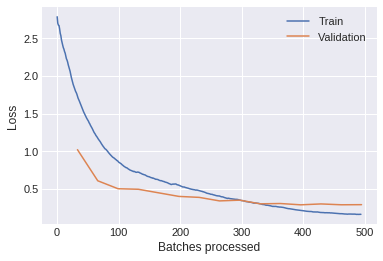

In [31]:
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
6.309573444801933e-07


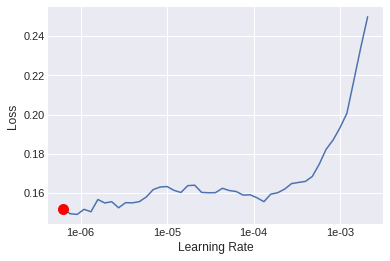

In [32]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [33]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('melspec_alexnet')

epoch,train_loss,valid_loss,accuracy,time
0,0.158422,0.294004,0.920883,00:25
1,0.157572,0.291943,0.916283,00:26
2,0.162463,0.290184,0.916283,00:26
3,0.153667,0.287781,0.919963,00:25
4,0.150927,0.287672,0.919963,00:28
5,0.149547,0.287268,0.921803,00:26
6,0.150281,0.285406,0.920883,00:25
7,0.150328,0.291923,0.915363,00:26
8,0.151767,0.285936,0.919963,00:27
9,0.154536,0.284783,0.920883,00:25


Better model found at epoch 0 with accuracy value: 0.9208831787109375.
Better model found at epoch 5 with accuracy value: 0.9218031167984009.


0.9933830606352263

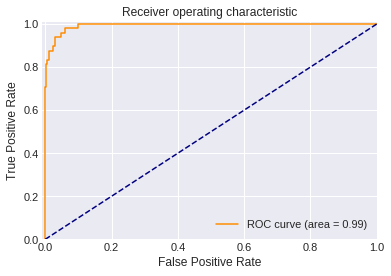

In [34]:
cal_auc_and_plot(learn)

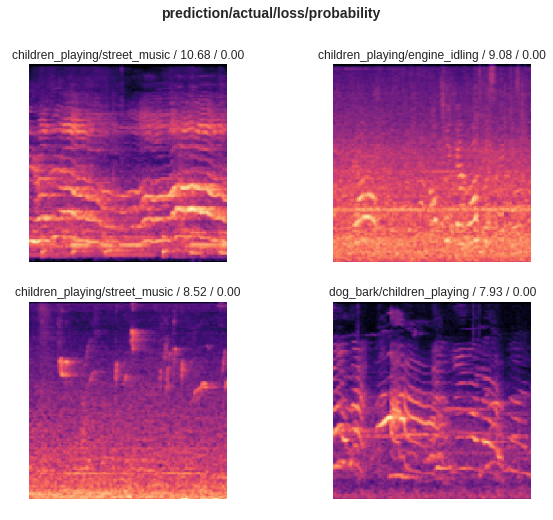

In [35]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

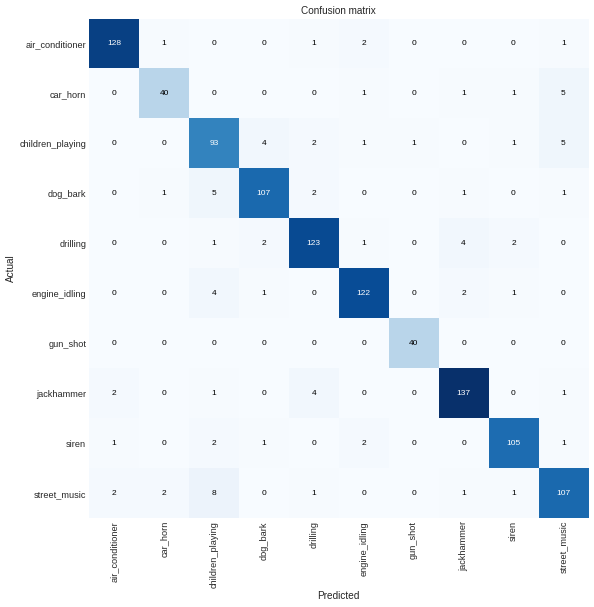

[('street_music', 'children_playing', 8),
 ('car_horn', 'street_music', 5),
 ('children_playing', 'street_music', 5),
 ('dog_bark', 'children_playing', 5),
 ('children_playing', 'dog_bark', 4),
 ('drilling', 'jackhammer', 4),
 ('engine_idling', 'children_playing', 4),
 ('jackhammer', 'drilling', 4),
 ('air_conditioner', 'engine_idling', 2),
 ('children_playing', 'drilling', 2),
 ('dog_bark', 'drilling', 2),
 ('drilling', 'dog_bark', 2),
 ('drilling', 'siren', 2),
 ('engine_idling', 'jackhammer', 2),
 ('jackhammer', 'air_conditioner', 2),
 ('siren', 'children_playing', 2),
 ('siren', 'engine_idling', 2),
 ('street_music', 'air_conditioner', 2),
 ('street_music', 'car_horn', 2),
 ('air_conditioner', 'car_horn', 1),
 ('air_conditioner', 'drilling', 1),
 ('air_conditioner', 'street_music', 1),
 ('car_horn', 'engine_idling', 1),
 ('car_horn', 'jackhammer', 1),
 ('car_horn', 'siren', 1),
 ('children_playing', 'engine_idling', 1),
 ('children_playing', 'gun_shot', 1),
 ('children_playing', 's

In [36]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()
interp.most_confused()

# Transfer Learning using VGG


In [38]:
import torchvision.models as models
learn = create_cnn(melspec_data, models.vgg16, metrics=[accuracy], ps=0.5);
learn.summary()

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /tmp/.torch/models/vgg16-397923af.pth
553433881it [00:07, 72807960.23it/s]


Layer (type)         Output Shape         Param #    Trainable 
Conv2d               [64, 224, 224]       1,792      False     
______________________________________________________________________
ReLU                 [64, 224, 224]       0          False     
______________________________________________________________________
Conv2d               [64, 224, 224]       36,928     False     
______________________________________________________________________
ReLU                 [64, 224, 224]       0          False     
______________________________________________________________________
MaxPool2d            [64, 112, 112]       0          False     
______________________________________________________________________
Conv2d               [128, 112, 112]      73,856     False     
______________________________________________________________________
ReLU                 [128, 112, 112]      0          False     
______________________________________________________________

# Training the model

In [39]:
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,time
0,1.553816,0.938885,0.707452,00:43
1,1.005345,0.546696,0.827047,00:36
2,0.712162,0.467688,0.838086,00:37
3,0.573589,0.497903,0.830727,00:37
4,0.487034,0.477826,0.844526,00:37
5,0.403939,0.475661,0.851886,00:36
6,0.343738,0.417093,0.861086,00:37
7,0.285336,0.448569,0.863845,00:36
8,0.228377,0.372191,0.891444,00:36
9,0.191692,0.366999,0.877645,00:37


Better model found at epoch 0 with accuracy value: 0.7074517011642456.
Better model found at epoch 1 with accuracy value: 0.8270469307899475.
Better model found at epoch 2 with accuracy value: 0.8380864858627319.
Better model found at epoch 4 with accuracy value: 0.8445262312889099.
Better model found at epoch 5 with accuracy value: 0.8518859148025513.
Better model found at epoch 6 with accuracy value: 0.8610855340957642.
Better model found at epoch 7 with accuracy value: 0.8638454675674438.
Better model found at epoch 8 with accuracy value: 0.8914443254470825.
Better model found at epoch 10 with accuracy value: 0.8969641327857971.


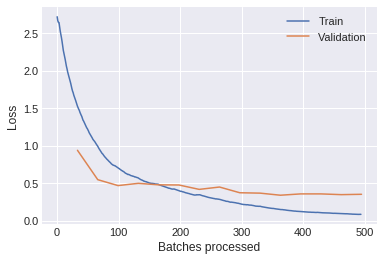

In [40]:
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
6.309573444801933e-07


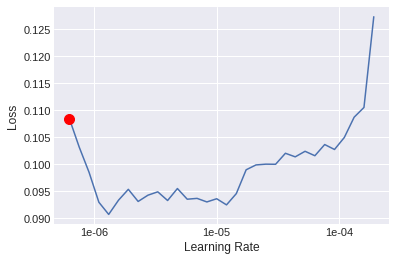

In [41]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [42]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('mels_train_vgg')

epoch,train_loss,valid_loss,accuracy,time
0,0.100886,0.344526,0.894204,00:55
1,0.094084,0.343406,0.892364,00:56
2,0.095236,0.340292,0.896044,00:56
3,0.095103,0.336662,0.896964,00:56
4,0.094757,0.340406,0.896044,00:56
5,0.089121,0.334435,0.901564,00:55
6,0.084891,0.334344,0.898804,00:55
7,0.083736,0.334131,0.895124,00:56
8,0.082086,0.335258,0.896044,00:55
9,0.084553,0.334993,0.897884,00:56


Better model found at epoch 0 with accuracy value: 0.8942042589187622.
Better model found at epoch 2 with accuracy value: 0.896044135093689.
Better model found at epoch 3 with accuracy value: 0.8969641327857971.
Better model found at epoch 5 with accuracy value: 0.9015639424324036.


0.9981753288418351

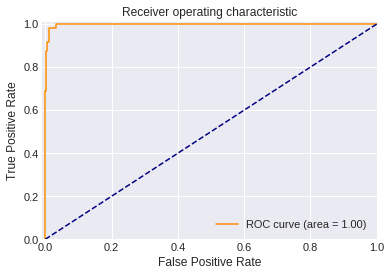

In [43]:
cal_auc_and_plot(learn)

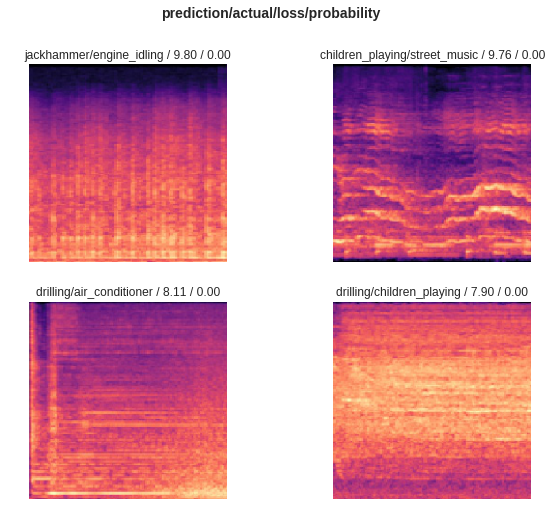

In [44]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

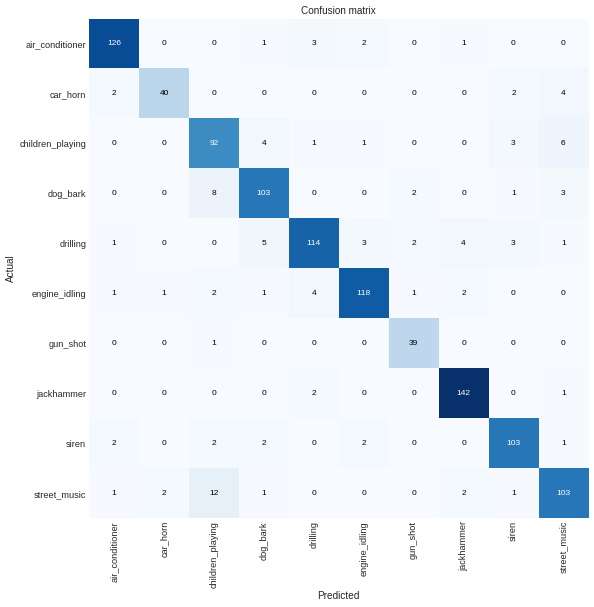

[('street_music', 'children_playing', 12),
 ('dog_bark', 'children_playing', 8),
 ('children_playing', 'street_music', 6),
 ('drilling', 'dog_bark', 5),
 ('car_horn', 'street_music', 4),
 ('children_playing', 'dog_bark', 4),
 ('drilling', 'jackhammer', 4),
 ('engine_idling', 'drilling', 4),
 ('air_conditioner', 'drilling', 3),
 ('children_playing', 'siren', 3),
 ('dog_bark', 'street_music', 3),
 ('drilling', 'engine_idling', 3),
 ('drilling', 'siren', 3),
 ('air_conditioner', 'engine_idling', 2),
 ('car_horn', 'air_conditioner', 2),
 ('car_horn', 'siren', 2),
 ('dog_bark', 'gun_shot', 2),
 ('drilling', 'gun_shot', 2),
 ('engine_idling', 'children_playing', 2),
 ('engine_idling', 'jackhammer', 2),
 ('jackhammer', 'drilling', 2),
 ('siren', 'air_conditioner', 2),
 ('siren', 'children_playing', 2),
 ('siren', 'dog_bark', 2),
 ('siren', 'engine_idling', 2),
 ('street_music', 'car_horn', 2),
 ('street_music', 'jackhammer', 2),
 ('air_conditioner', 'dog_bark', 1),
 ('air_conditioner', 'jackh

In [45]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()
interp.most_confused()

![](//i.imgur.com/uwJGw4u.jpg)

# Mel Frequency Cepstral Coefficients 

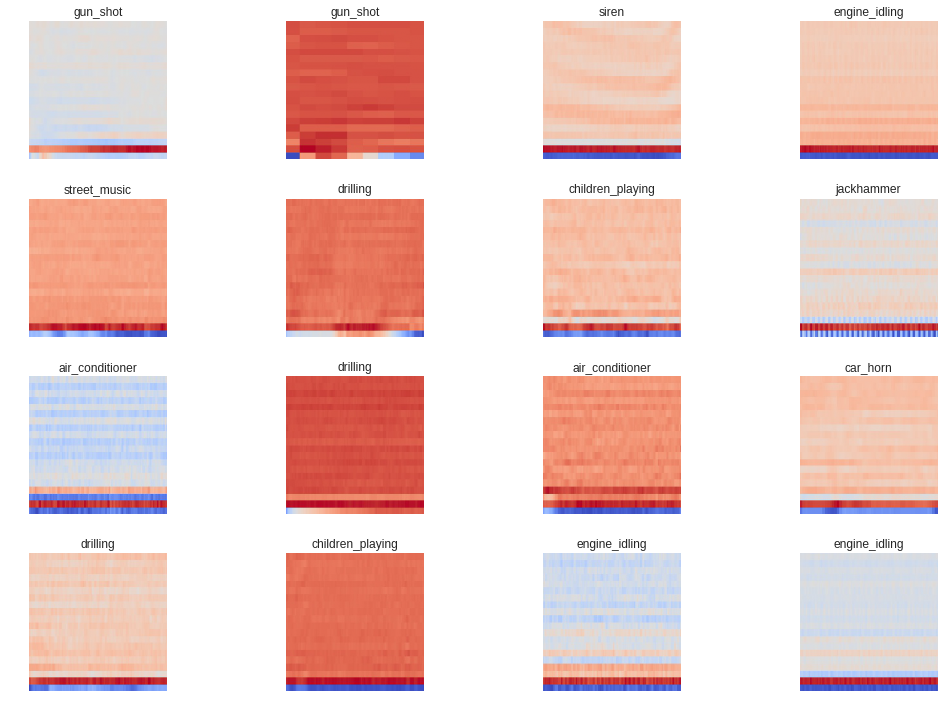

In [46]:
mfccs_data.show_batch(4, figsize=(15,10))
plt.show()

# Resnet34

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,time
0,1.891468,1.297683,0.573137,00:30
1,1.302592,0.892382,0.703772,00:31
2,0.975501,0.969957,0.701012,00:31
3,0.818209,1.141878,0.643054,00:30
4,0.692043,1.171794,0.686293,00:31
5,0.586620,0.834261,0.721251,00:30
6,0.491469,0.891227,0.751610,00:30
7,0.403757,1.850150,0.606256,00:31
8,0.342004,0.605212,0.818767,00:30
9,0.265970,0.563463,0.846366,00:30


Better model found at epoch 0 with accuracy value: 0.5731370449066162.
Better model found at epoch 1 with accuracy value: 0.7037718296051025.
Better model found at epoch 5 with accuracy value: 0.7212511301040649.
Better model found at epoch 6 with accuracy value: 0.7516099214553833.
Better model found at epoch 8 with accuracy value: 0.818767249584198.
Better model found at epoch 9 with accuracy value: 0.8463661670684814.
Better model found at epoch 11 with accuracy value: 0.8877645134925842.
Better model found at epoch 13 with accuracy value: 0.8942042589187622.


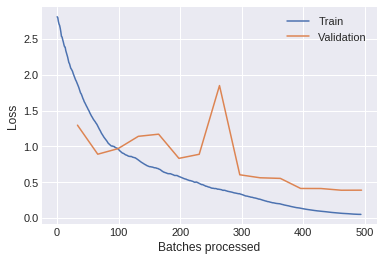

In [47]:
learn = create_cnn(mfccs_data, models.resnet34, metrics=[accuracy], ps=0.5, )
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
6.309573444801933e-07


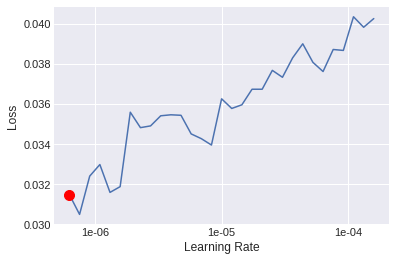

In [48]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [49]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('mfccs_train_1')

epoch,train_loss,valid_loss,accuracy,time
0,0.034062,0.391571,0.890524,00:33
1,0.034905,0.391072,0.892364,00:34
2,0.034736,0.386500,0.894204,00:33
3,0.033038,0.386225,0.895124,00:34
4,0.033984,0.383128,0.893284,00:33
5,0.032243,0.387024,0.895124,00:34
6,0.032466,0.385742,0.894204,00:34
7,0.030004,0.384471,0.894204,00:33
8,0.028358,0.379080,0.895124,00:34
9,0.027637,0.382043,0.896964,00:33


Better model found at epoch 0 with accuracy value: 0.8905243873596191.
Better model found at epoch 1 with accuracy value: 0.8923643231391907.
Better model found at epoch 2 with accuracy value: 0.8942042589187622.
Better model found at epoch 3 with accuracy value: 0.8951241970062256.
Better model found at epoch 9 with accuracy value: 0.8969641327857971.


0.990382359840488

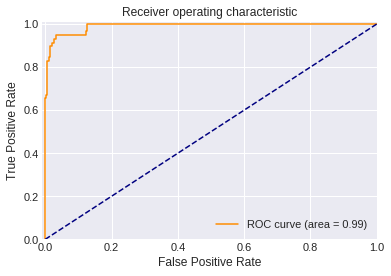

In [50]:
cal_auc_and_plot(learn)

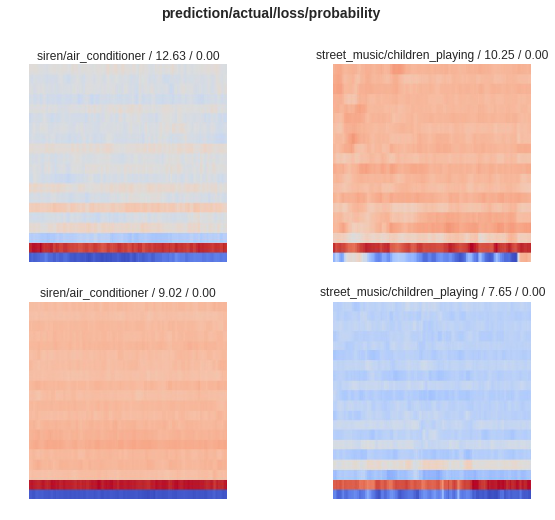

In [51]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

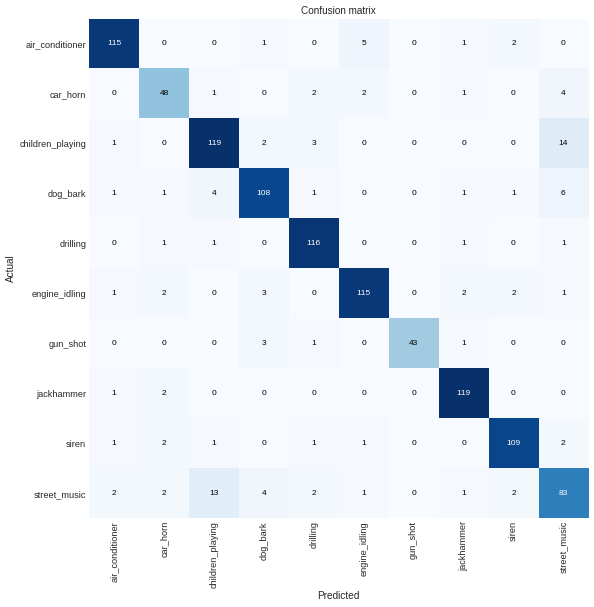

[('children_playing', 'street_music', 14),
 ('street_music', 'children_playing', 13),
 ('dog_bark', 'street_music', 6),
 ('air_conditioner', 'engine_idling', 5),
 ('car_horn', 'street_music', 4),
 ('dog_bark', 'children_playing', 4),
 ('street_music', 'dog_bark', 4),
 ('children_playing', 'drilling', 3),
 ('engine_idling', 'dog_bark', 3),
 ('gun_shot', 'dog_bark', 3),
 ('air_conditioner', 'siren', 2),
 ('car_horn', 'drilling', 2),
 ('car_horn', 'engine_idling', 2),
 ('children_playing', 'dog_bark', 2),
 ('engine_idling', 'car_horn', 2),
 ('engine_idling', 'jackhammer', 2),
 ('engine_idling', 'siren', 2),
 ('jackhammer', 'car_horn', 2),
 ('siren', 'car_horn', 2),
 ('siren', 'street_music', 2),
 ('street_music', 'air_conditioner', 2),
 ('street_music', 'car_horn', 2),
 ('street_music', 'drilling', 2),
 ('street_music', 'siren', 2),
 ('air_conditioner', 'dog_bark', 1),
 ('air_conditioner', 'jackhammer', 1),
 ('car_horn', 'children_playing', 1),
 ('car_horn', 'jackhammer', 1),
 ('children_

In [52]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()
interp.most_confused()

# Alexnet

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,time
0,1.997305,1.363717,0.556578,00:23
1,1.488204,0.951041,0.692732,00:23
2,1.191318,0.852175,0.720331,00:24
3,1.034006,0.813466,0.739650,00:24
4,0.926642,0.761029,0.747010,00:23
5,0.857909,0.719229,0.772769,00:23
6,0.794801,0.720557,0.769089,00:25
7,0.723716,0.645307,0.783809,00:25
8,0.658437,0.620453,0.807728,00:23
9,0.601208,0.605450,0.812328,00:25


Better model found at epoch 0 with accuracy value: 0.556577742099762.
Better model found at epoch 1 with accuracy value: 0.6927322745323181.
Better model found at epoch 2 with accuracy value: 0.7203311920166016.
Better model found at epoch 3 with accuracy value: 0.7396504282951355.
Better model found at epoch 4 with accuracy value: 0.7470101118087769.
Better model found at epoch 5 with accuracy value: 0.7727690935134888.
Better model found at epoch 7 with accuracy value: 0.7838086485862732.
Better model found at epoch 8 with accuracy value: 0.8077276945114136.
Better model found at epoch 9 with accuracy value: 0.81232750415802.
Better model found at epoch 10 with accuracy value: 0.8141674399375916.
Better model found at epoch 11 with accuracy value: 0.831646740436554.
Better model found at epoch 12 with accuracy value: 0.8380864858627319.
Better model found at epoch 14 with accuracy value: 0.8399264216423035.


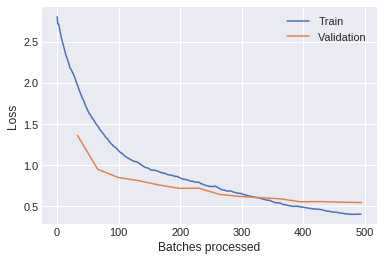

In [54]:
learn = create_cnn(mfccs_data, models.alexnet, metrics=[accuracy])
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 1.91E-06
1.9054607179632473e-06


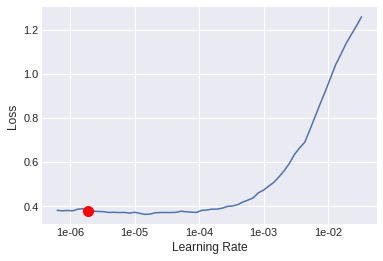

In [55]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [56]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('mfccs_train_1')

epoch,train_loss,valid_loss,accuracy,time
0,0.372196,0.543949,0.841766,00:25
1,0.375981,0.545567,0.840846,00:24
2,0.384904,0.543687,0.842686,00:26
3,0.370527,0.539264,0.844526,00:24
4,0.372200,0.547525,0.839926,00:24
5,0.362147,0.540226,0.840846,00:25
6,0.353210,0.544325,0.843606,00:25
7,0.350604,0.535916,0.842686,00:24
8,0.351158,0.535257,0.843606,00:24
9,0.350233,0.536420,0.843606,00:26


Better model found at epoch 0 with accuracy value: 0.841766357421875.
Better model found at epoch 2 with accuracy value: 0.8426862955093384.
Better model found at epoch 3 with accuracy value: 0.8445262312889099.
Better model found at epoch 11 with accuracy value: 0.8500459790229797.


0.9708287255789015

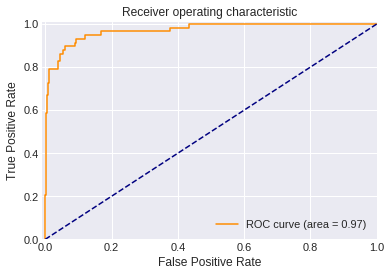

In [57]:
cal_auc_and_plot(learn)

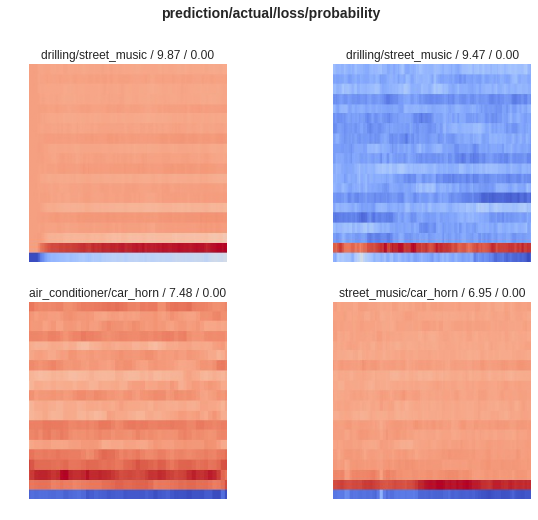

In [58]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

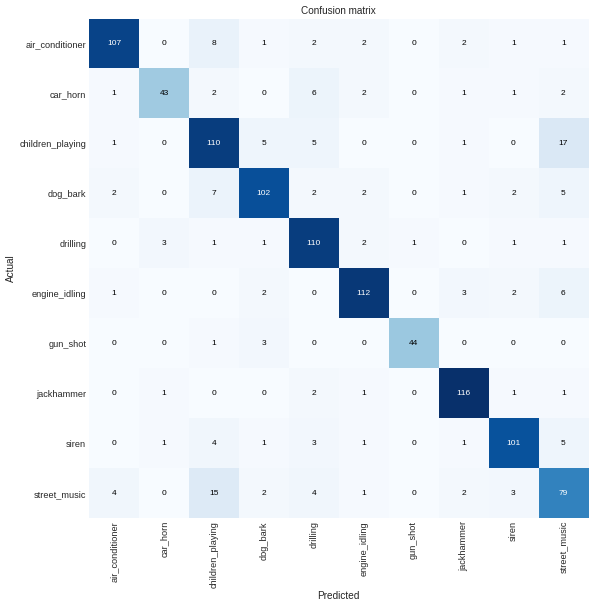

In [61]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()

In [62]:
interp.most_confused()

[('children_playing', 'street_music', 17),
 ('street_music', 'children_playing', 15),
 ('air_conditioner', 'children_playing', 8),
 ('dog_bark', 'children_playing', 7),
 ('car_horn', 'drilling', 6),
 ('engine_idling', 'street_music', 6),
 ('children_playing', 'dog_bark', 5),
 ('children_playing', 'drilling', 5),
 ('dog_bark', 'street_music', 5),
 ('siren', 'street_music', 5),
 ('siren', 'children_playing', 4),
 ('street_music', 'air_conditioner', 4),
 ('street_music', 'drilling', 4),
 ('drilling', 'car_horn', 3),
 ('engine_idling', 'jackhammer', 3),
 ('gun_shot', 'dog_bark', 3),
 ('siren', 'drilling', 3),
 ('street_music', 'siren', 3),
 ('air_conditioner', 'drilling', 2),
 ('air_conditioner', 'engine_idling', 2),
 ('air_conditioner', 'jackhammer', 2),
 ('car_horn', 'children_playing', 2),
 ('car_horn', 'engine_idling', 2),
 ('car_horn', 'street_music', 2),
 ('dog_bark', 'air_conditioner', 2),
 ('dog_bark', 'drilling', 2),
 ('dog_bark', 'engine_idling', 2),
 ('dog_bark', 'siren', 2),
 (

# VGG

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.938350,1.384540,0.555658,0.444342,00:34
1,1.390961,0.954044,0.699172,0.300828,00:35
2,1.089758,0.853074,0.718491,0.281509,00:35
3,0.954766,0.846821,0.733211,0.266789,00:37
4,0.844154,0.811505,0.763569,0.236431,00:35
5,0.752381,0.815724,0.746090,0.253910,00:35
6,0.655840,0.830586,0.748850,0.251150,00:35
7,0.573962,0.752590,0.753450,0.246550,00:34
8,0.501999,0.738919,0.781969,0.218031,00:35
9,0.430514,0.700479,0.795768,0.204232,00:35


Better model found at epoch 0 with accuracy value: 0.5556577444076538.
Better model found at epoch 1 with accuracy value: 0.6991720199584961.
Better model found at epoch 2 with accuracy value: 0.71849125623703.
Better model found at epoch 3 with accuracy value: 0.7332106828689575.
Better model found at epoch 4 with accuracy value: 0.7635694742202759.
Better model found at epoch 8 with accuracy value: 0.7819687128067017.
Better model found at epoch 9 with accuracy value: 0.795768141746521.
Better model found at epoch 11 with accuracy value: 0.7966881394386292.
Better model found at epoch 12 with accuracy value: 0.7976080775260925.
Better model found at epoch 14 with accuracy value: 0.8003680109977722.


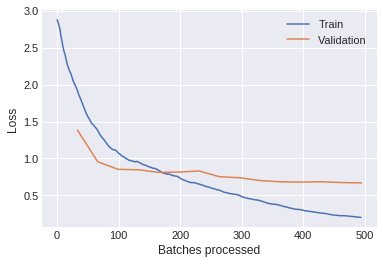

In [63]:
learn = create_cnn(mfccs_data, models.vgg16, metrics=[accuracy, error_rate], ps=0.5);
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.31E-06
3.311311214825911e-06


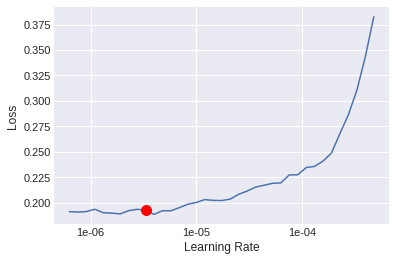

In [64]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [65]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.193030,0.667459,0.797608,0.202392,00:52
1,0.191966,0.665157,0.801288,0.198712,00:53
2,0.185044,0.664344,0.801288,0.198712,00:54
3,0.185627,0.674092,0.804968,0.195032,00:52
4,0.186792,0.661650,0.805888,0.194112,00:53
5,0.175028,0.663073,0.812328,0.187672,00:53
6,0.168774,0.639758,0.817847,0.182153,00:52
7,0.164052,0.637143,0.818767,0.181233,00:53
8,0.159144,0.655490,0.816927,0.183073,00:54
9,0.151299,0.647296,0.817847,0.182153,00:52


Better model found at epoch 0 with accuracy value: 0.7976080775260925.
Better model found at epoch 1 with accuracy value: 0.8012879490852356.
Better model found at epoch 3 with accuracy value: 0.8049678206443787.
Better model found at epoch 4 with accuracy value: 0.805887758731842.
Better model found at epoch 5 with accuracy value: 0.81232750415802.
Better model found at epoch 6 with accuracy value: 0.8178473114967346.
Better model found at epoch 7 with accuracy value: 0.818767249584198.


0.9575416373445931

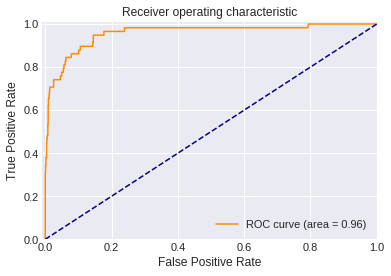

In [66]:
cal_auc_and_plot(learn)

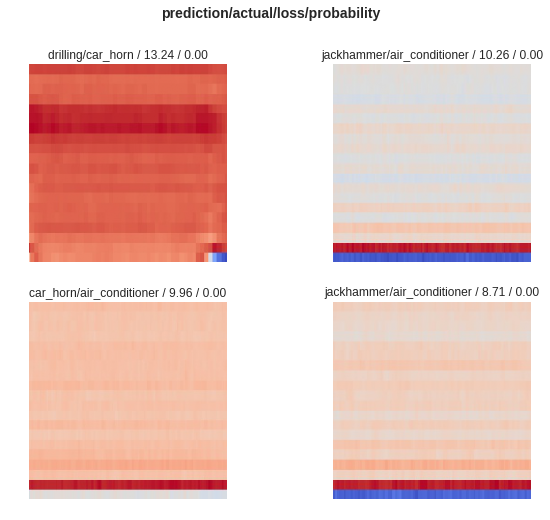

In [67]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

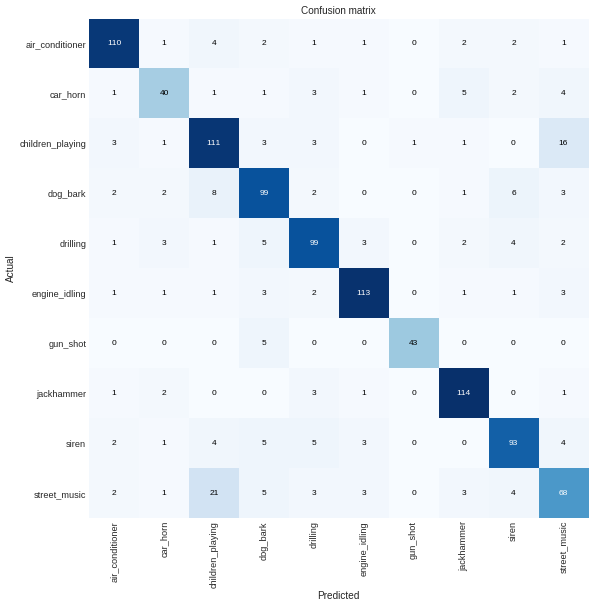

In [69]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()


In [70]:
interp.most_confused()

[('street_music', 'children_playing', 21),
 ('children_playing', 'street_music', 16),
 ('dog_bark', 'children_playing', 8),
 ('dog_bark', 'siren', 6),
 ('car_horn', 'jackhammer', 5),
 ('drilling', 'dog_bark', 5),
 ('gun_shot', 'dog_bark', 5),
 ('siren', 'dog_bark', 5),
 ('siren', 'drilling', 5),
 ('street_music', 'dog_bark', 5),
 ('air_conditioner', 'children_playing', 4),
 ('car_horn', 'street_music', 4),
 ('drilling', 'siren', 4),
 ('siren', 'children_playing', 4),
 ('siren', 'street_music', 4),
 ('street_music', 'siren', 4),
 ('car_horn', 'drilling', 3),
 ('children_playing', 'air_conditioner', 3),
 ('children_playing', 'dog_bark', 3),
 ('children_playing', 'drilling', 3),
 ('dog_bark', 'street_music', 3),
 ('drilling', 'car_horn', 3),
 ('drilling', 'engine_idling', 3),
 ('engine_idling', 'dog_bark', 3),
 ('engine_idling', 'street_music', 3),
 ('jackhammer', 'drilling', 3),
 ('siren', 'engine_idling', 3),
 ('street_music', 'drilling', 3),
 ('street_music', 'engine_idling', 3),
 ('st

![](//i.imgur.com/Zk8Ck0f.jpg)

# Chroma Short Time Fourier Transform

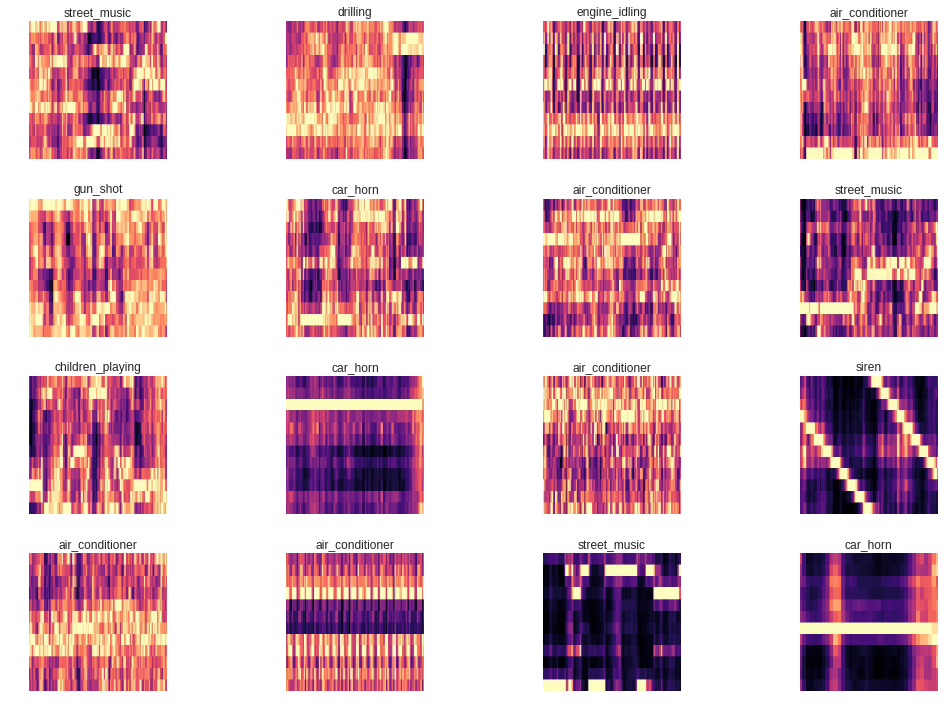

In [71]:
chroma_data.show_batch(4, figsize=(15,10))
plt.show()

# Resnet 34

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.008325,1.455564,0.490340,0.509660,00:31
1,1.522311,1.259003,0.557498,0.442502,00:32
2,1.255285,1.250416,0.558418,0.441582,00:31
3,1.108515,1.374422,0.533579,0.466421,00:32
4,0.978679,1.572345,0.528059,0.471941,00:33
5,0.866207,1.753756,0.522539,0.477461,00:31
6,0.744202,1.708370,0.541858,0.458142,00:32
7,0.622953,1.496883,0.574977,0.425023,00:31
8,0.535469,1.530730,0.570377,0.429623,00:32
9,0.448902,1.276004,0.660534,0.339466,00:31


Better model found at epoch 0 with accuracy value: 0.49034038186073303.
Better model found at epoch 1 with accuracy value: 0.5574976801872253.
Better model found at epoch 2 with accuracy value: 0.5584176778793335.
Better model found at epoch 7 with accuracy value: 0.5749769806861877.
Better model found at epoch 9 with accuracy value: 0.660533607006073.
Better model found at epoch 11 with accuracy value: 0.7129715085029602.
Better model found at epoch 12 with accuracy value: 0.7359705567359924.


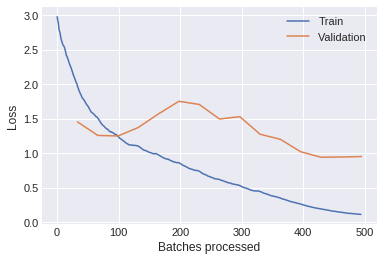

In [72]:
learn = create_cnn(chroma_data, models.resnet34, metrics=[accuracy, error_rate], ps=0.5)
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 3.98E-06
3.981071705534973e-06


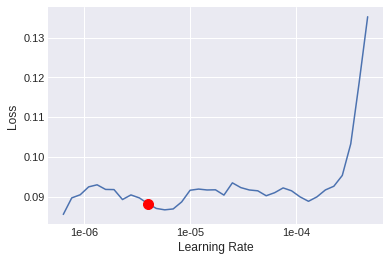

In [73]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [74]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('chroma_train_2')

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.092124,0.944389,0.737810,0.262190,00:34
1,0.093292,0.948743,0.733211,0.266789,00:35
2,0.084948,0.938512,0.735051,0.264949,00:34
3,0.081450,0.929301,0.735051,0.264949,00:34
4,0.077119,0.926590,0.734131,0.265869,00:35
5,0.066889,0.931951,0.738730,0.261270,00:34
6,0.062548,0.936131,0.747010,0.252990,00:36
7,0.054059,0.943345,0.747010,0.252990,00:34
8,0.048618,0.931537,0.750690,0.249310,00:35
9,0.046671,0.933720,0.743330,0.256670,00:34


Better model found at epoch 0 with accuracy value: 0.737810492515564.
Better model found at epoch 5 with accuracy value: 0.7387304306030273.
Better model found at epoch 6 with accuracy value: 0.7470101118087769.
Better model found at epoch 8 with accuracy value: 0.7506899833679199.


0.9840649801587301

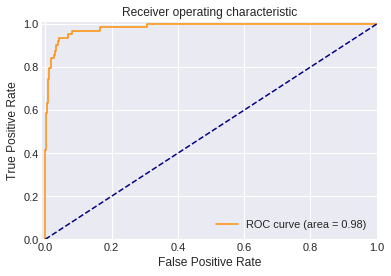

In [75]:
cal_auc_and_plot(learn)

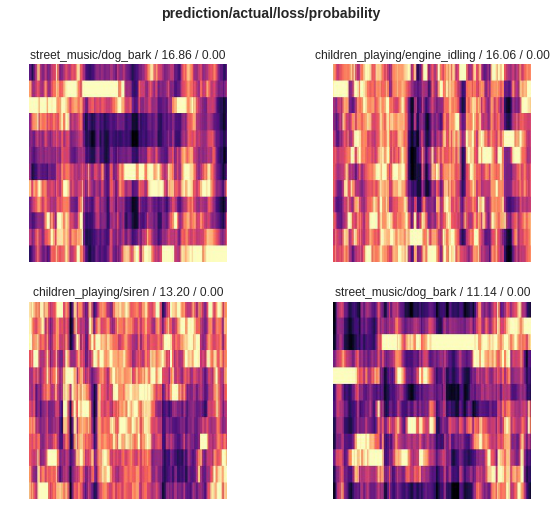

In [76]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

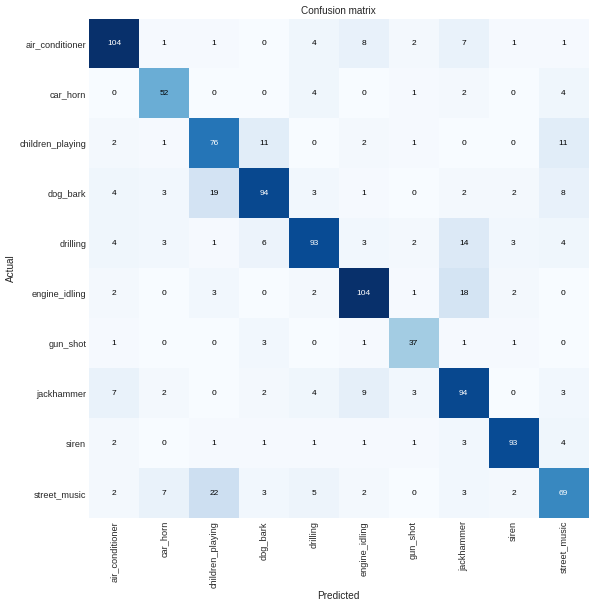

In [77]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()

In [78]:
interp.most_confused()

[('street_music', 'children_playing', 22),
 ('dog_bark', 'children_playing', 19),
 ('engine_idling', 'jackhammer', 18),
 ('drilling', 'jackhammer', 14),
 ('children_playing', 'dog_bark', 11),
 ('children_playing', 'street_music', 11),
 ('jackhammer', 'engine_idling', 9),
 ('air_conditioner', 'engine_idling', 8),
 ('dog_bark', 'street_music', 8),
 ('air_conditioner', 'jackhammer', 7),
 ('jackhammer', 'air_conditioner', 7),
 ('street_music', 'car_horn', 7),
 ('drilling', 'dog_bark', 6),
 ('street_music', 'drilling', 5),
 ('air_conditioner', 'drilling', 4),
 ('car_horn', 'drilling', 4),
 ('car_horn', 'street_music', 4),
 ('dog_bark', 'air_conditioner', 4),
 ('drilling', 'air_conditioner', 4),
 ('drilling', 'street_music', 4),
 ('jackhammer', 'drilling', 4),
 ('siren', 'street_music', 4),
 ('dog_bark', 'car_horn', 3),
 ('dog_bark', 'drilling', 3),
 ('drilling', 'car_horn', 3),
 ('drilling', 'engine_idling', 3),
 ('drilling', 'siren', 3),
 ('engine_idling', 'children_playing', 3),
 ('gun_sh

# Alexnet

/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,2.071027,1.500983,0.474701,0.525299,00:24
1,1.664106,1.277228,0.550138,0.449862,00:24
2,1.438648,1.210436,0.571297,0.428703,00:26
3,1.309855,1.220134,0.576817,0.423183,00:24
4,1.231272,1.221940,0.566697,0.433303,00:24
5,1.150785,1.190481,0.592456,0.407544,00:26
6,1.072447,1.184710,0.580497,0.419503,00:24
7,0.994649,1.186070,0.608096,0.391904,00:24
8,0.922161,1.147501,0.616375,0.383625,00:26
9,0.853582,1.124468,0.612696,0.387305,00:24


Better model found at epoch 0 with accuracy value: 0.47470101714134216.
Better model found at epoch 1 with accuracy value: 0.550137996673584.
Better model found at epoch 2 with accuracy value: 0.5712971687316895.
Better model found at epoch 3 with accuracy value: 0.5768169164657593.
Better model found at epoch 5 with accuracy value: 0.5924562811851501.
Better model found at epoch 7 with accuracy value: 0.6080957055091858.
Better model found at epoch 8 with accuracy value: 0.6163753271102905.
Better model found at epoch 10 with accuracy value: 0.6172953248023987.
Better model found at epoch 11 with accuracy value: 0.6182152628898621.
Better model found at epoch 12 with accuracy value: 0.6356945633888245.


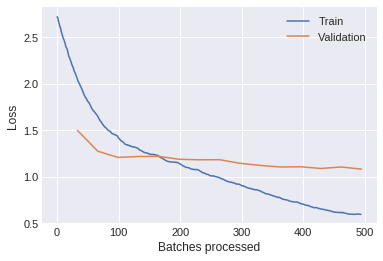

In [79]:
learn = create_cnn(chroma_data, models.alexnet, metrics=[accuracy, error_rate], ps=0.5)
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 5.75E-06
5.754399373371569e-06


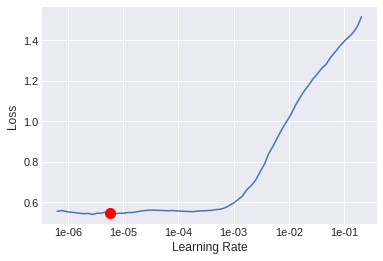

In [80]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [81]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.save('chroma_train_2')

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.570504,1.094864,0.639374,0.360626,00:26
1,0.569265,1.082649,0.636615,0.363385,00:26
2,0.561416,1.078191,0.639374,0.360626,00:25
3,0.559291,1.068931,0.646734,0.353266,00:26
4,0.564964,1.058640,0.644894,0.355106,00:26
5,0.556532,1.060583,0.641214,0.358786,00:27
6,0.542709,1.055505,0.648574,0.351426,00:26
7,0.537485,1.053670,0.643054,0.356946,00:26
8,0.520035,1.037714,0.647654,0.352346,00:25
9,0.514015,1.062493,0.646734,0.353266,00:26


Better model found at epoch 0 with accuracy value: 0.6393744349479675.
Better model found at epoch 3 with accuracy value: 0.6467341184616089.
Better model found at epoch 6 with accuracy value: 0.6485740542411804.
Better model found at epoch 13 with accuracy value: 0.6494939923286438.


0.9781281001984127

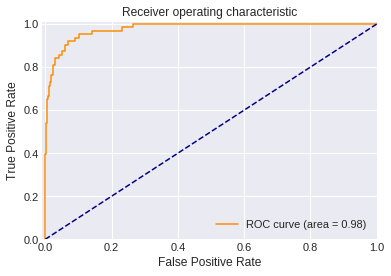

In [82]:
cal_auc_and_plot(learn)

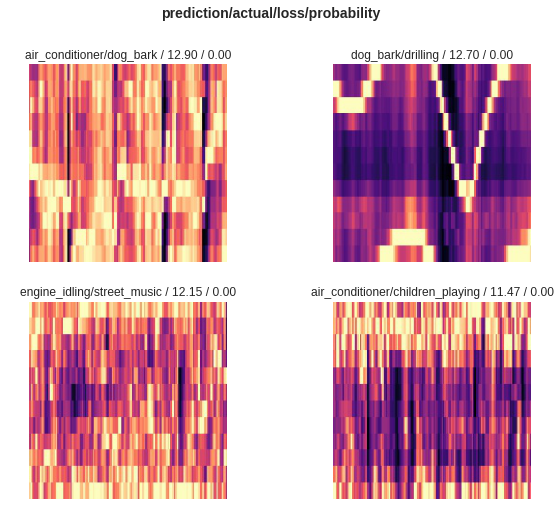

In [83]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

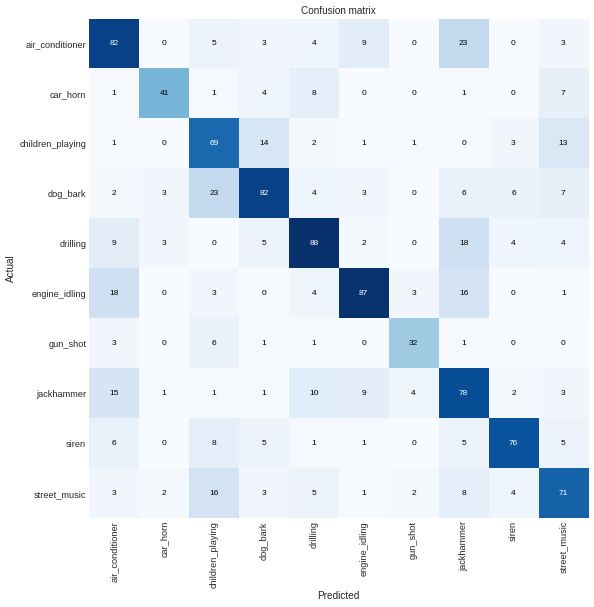

In [85]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()


In [86]:
interp.most_confused()

[('air_conditioner', 'jackhammer', 23),
 ('dog_bark', 'children_playing', 23),
 ('drilling', 'jackhammer', 18),
 ('engine_idling', 'air_conditioner', 18),
 ('engine_idling', 'jackhammer', 16),
 ('street_music', 'children_playing', 16),
 ('jackhammer', 'air_conditioner', 15),
 ('children_playing', 'dog_bark', 14),
 ('children_playing', 'street_music', 13),
 ('jackhammer', 'drilling', 10),
 ('air_conditioner', 'engine_idling', 9),
 ('drilling', 'air_conditioner', 9),
 ('jackhammer', 'engine_idling', 9),
 ('car_horn', 'drilling', 8),
 ('siren', 'children_playing', 8),
 ('street_music', 'jackhammer', 8),
 ('car_horn', 'street_music', 7),
 ('dog_bark', 'street_music', 7),
 ('dog_bark', 'jackhammer', 6),
 ('dog_bark', 'siren', 6),
 ('gun_shot', 'children_playing', 6),
 ('siren', 'air_conditioner', 6),
 ('air_conditioner', 'children_playing', 5),
 ('drilling', 'dog_bark', 5),
 ('siren', 'dog_bark', 5),
 ('siren', 'jackhammer', 5),
 ('siren', 'street_music', 5),
 ('street_music', 'drilling', 5

# VGG


/opt/conda/lib/python3.6/site-packages/fastai/vision/learner.py:105: UserWarning: `create_cnn` is deprecated and is now named `cnn_learner`.
  warn("`create_cnn` is deprecated and is now named `cnn_learner`.")


epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.983365,1.494807,0.469181,0.530819,00:34
1,1.576938,1.238923,0.562097,0.437902,00:34
2,1.348037,1.257550,0.566697,0.433303,00:35
3,1.239690,1.223362,0.571297,0.428703,00:34
4,1.162100,1.191044,0.576817,0.423183,00:35
5,1.071982,1.211175,0.609016,0.390984,00:34
6,0.999881,1.228299,0.596136,0.403864,00:35
7,0.934387,1.191491,0.597056,0.402944,00:35
8,0.840737,1.196488,0.622815,0.377185,00:35
9,0.752024,1.190014,0.611776,0.388224,00:35


Better model found at epoch 0 with accuracy value: 0.46918123960494995.
Better model found at epoch 1 with accuracy value: 0.5620974898338318.
Better model found at epoch 2 with accuracy value: 0.566697359085083.
Better model found at epoch 3 with accuracy value: 0.5712971687316895.
Better model found at epoch 4 with accuracy value: 0.5768169164657593.
Better model found at epoch 5 with accuracy value: 0.6090156435966492.
Better model found at epoch 8 with accuracy value: 0.6228150725364685.
Better model found at epoch 10 with accuracy value: 0.6393744349479675.


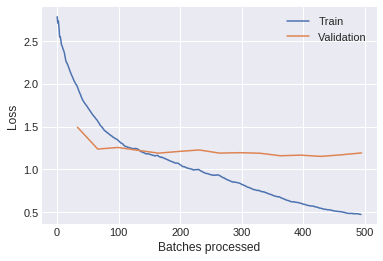

In [88]:
learn = create_cnn(chroma_data, models.vgg16, metrics=[accuracy, error_rate], ps=0.5)
learn.fit_one_cycle(15, 1e-2,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])
learn.recorder.plot_losses()
plt.show()

# Fine Tuning

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.
Min numerical gradient: 6.31E-07
6.309573444801933e-07


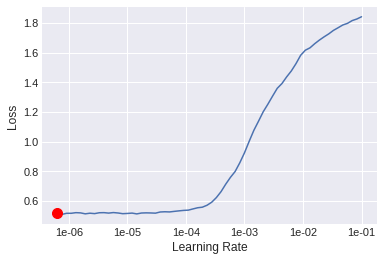

In [89]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot(suggestion=True)
Learning_rate = learn.recorder.min_grad_lr
print(Learning_rate)
plt.show()

In [90]:
learn.fit_one_cycle(15, Learning_rate,callbacks=[SaveModelCallback(learn, every='improvement', monitor='accuracy')])

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,0.517268,1.156473,0.641214,0.358786,00:54
1,0.524608,1.152718,0.643974,0.356026,00:53
2,0.517206,1.144820,0.636615,0.363385,00:54
3,0.513204,1.161713,0.633855,0.366145,00:54
4,0.505293,1.170943,0.628335,0.371665,00:53
5,0.505108,1.143783,0.632935,0.367065,00:54
6,0.500279,1.142694,0.637534,0.362466,00:54
7,0.499155,1.140710,0.643974,0.356026,00:53
8,0.498056,1.142849,0.634775,0.365225,00:55
9,0.493835,1.142262,0.633855,0.366145,00:55


Better model found at epoch 0 with accuracy value: 0.6412143707275391.
Better model found at epoch 1 with accuracy value: 0.643974244594574.


0.9593718998015872

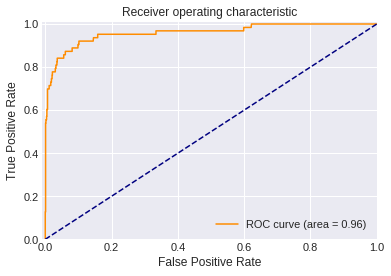

In [91]:
cal_auc_and_plot(learn)

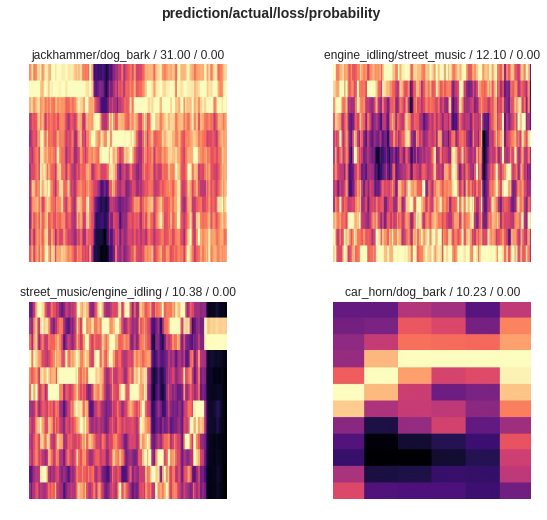

In [92]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(4, figsize=(10,8), heatmap=False)
plt.show()

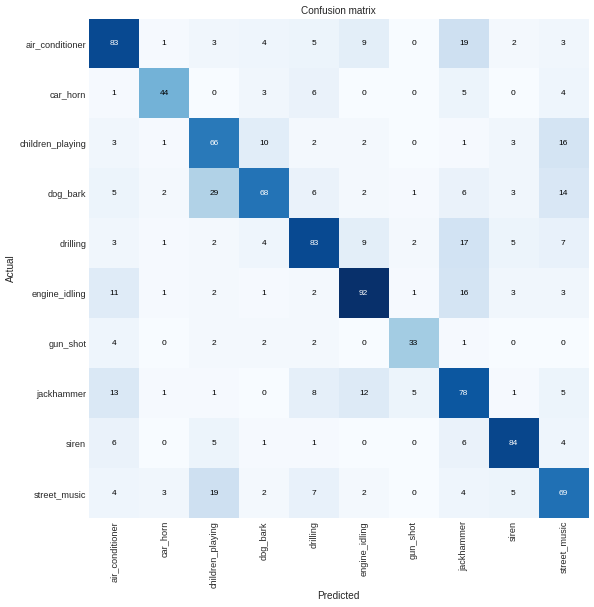

In [93]:
interp.plot_confusion_matrix(figsize=(10, 10), dpi=60)
plt.show()

In [94]:
interp.most_confused()

[('dog_bark', 'children_playing', 29),
 ('air_conditioner', 'jackhammer', 19),
 ('street_music', 'children_playing', 19),
 ('drilling', 'jackhammer', 17),
 ('children_playing', 'street_music', 16),
 ('engine_idling', 'jackhammer', 16),
 ('dog_bark', 'street_music', 14),
 ('jackhammer', 'air_conditioner', 13),
 ('jackhammer', 'engine_idling', 12),
 ('engine_idling', 'air_conditioner', 11),
 ('children_playing', 'dog_bark', 10),
 ('air_conditioner', 'engine_idling', 9),
 ('drilling', 'engine_idling', 9),
 ('jackhammer', 'drilling', 8),
 ('drilling', 'street_music', 7),
 ('street_music', 'drilling', 7),
 ('car_horn', 'drilling', 6),
 ('dog_bark', 'drilling', 6),
 ('dog_bark', 'jackhammer', 6),
 ('siren', 'air_conditioner', 6),
 ('siren', 'jackhammer', 6),
 ('air_conditioner', 'drilling', 5),
 ('car_horn', 'jackhammer', 5),
 ('dog_bark', 'air_conditioner', 5),
 ('drilling', 'siren', 5),
 ('jackhammer', 'gun_shot', 5),
 ('jackhammer', 'street_music', 5),
 ('siren', 'children_playing', 5),
 

![](//i.imgur.com/CQd6Yz6.jpg)

# Reference
*  [music-genre-classification-with-python](https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8?fbclid=IwAR24KYm_kffHIus5VlAwquqJvF9FFk10YjGDYGVGvC2eGkeKUxjRZ7N80D0)

* [audio-voice-processing-deep-learning](https://www.analyticsvidhya.com/blog/2017/08/audio-voice-processing-deep-learning/)

*  [MUSIC/AUDIO ANALYSIS IN PYTHON](https://cdn.cs50.net/2016/fall/seminars/automated_analysis_music/automated_analysis_music.pdf)

*  [Deep learning architectures for music audio classification](http://www.jordipons.me/media/UPC-2018.pdf)

*  [Classifying Environmental Sounds withImage Networks](https://pdfs.semanticscholar.org/09c2/f123e5f329f4143becad27075d7f8d8ee4d2.pdf)

*  [Librosa: Audio and Music Signal Analysis in Python](hhttp://conference.scipy.org/proceedings/scipy2015/pdfs/brian_mcfee.pdf)

*  [Ai which classifier sounds code](https://hackernoon.com/ai-which-classifies-sounds-code-python-6a07a2043810)

*  [How to teach Neural Networks to detect everyday sounds:](https://www.skcript.com/svr/building-audio-classifier-nueral-network/)

*  [Pytorch:](https://pytorch.org/)

* [Fastai:](https://docs.fast.ai/)

*  [transfer-learning-using-the-fastai-library](https://towardsdatascience.com/transfer-learning-using-the-fastai-library-d686b238213e)

*  [deep-learning-handwritten-arabic-digits](https://towardsdatascience.com/deep-learning-handwritten-arabic-digits-5c7abc3c0580)

*  [ten-techniques-from-fast-ai](https://blog.floydhub.com/ten-techniques-from-fast-ai/)

*  [Sounds augmentation:](https://www.kaggle.com/huseinzol05/sound-augmentation-librosa)

*  [Machine Learning for music:](https://www.slideshare.net/PetkoNikolov/machine-learning-for-music?qid=7e5ad741-4e48-4648-8bcc-f8ee919ff297&v=&b=&from_search=34)

*  [Single-word speech recognition with Convolutional Neural Networks on raw
waveforms](https://www.theseus.fi/bitstream/handle/10024/144982/Jansson_Patrick.pdf?sequence=1&isAllowed=y)

